In [1]:
import scanpy as sc
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib as mpl
import numpy as np
import scispy as scis
import seaborn as sns
import anndata as ad
import scvi
import matplotlib.patches as patches
import decoupler as dc
from pydeseq2.dds import DeseqDataSet
from pydeseq2.ds import DeseqStats

import warnings
warnings.filterwarnings('ignore')


/data/apps/miniconda3/envs/vizgen/lib/python3.10/site-packages/geopandas/_compat.py:124: UserWarning: The Shapely GEOS version (3.10.3-CAPI-1.16.1) is incompatible with the GEOS version PyGEOS was compiled with (3.10.4-CAPI-1.16.2). Conversions between both will be slow.
  warnings.warn(


>> clustergrammer2 backend version 0.18.0


Global seed set to 0


In [11]:
adc5 = sc.read_h5ad("./outs/adC5.htap.h5ad")
print('adc5 ',adc5.shape)
adp11 = sc.read_h5ad("./outs/adP11.htap.h5ad")
print('adp11 ',adp11.shape)

adc5  (154142, 293)


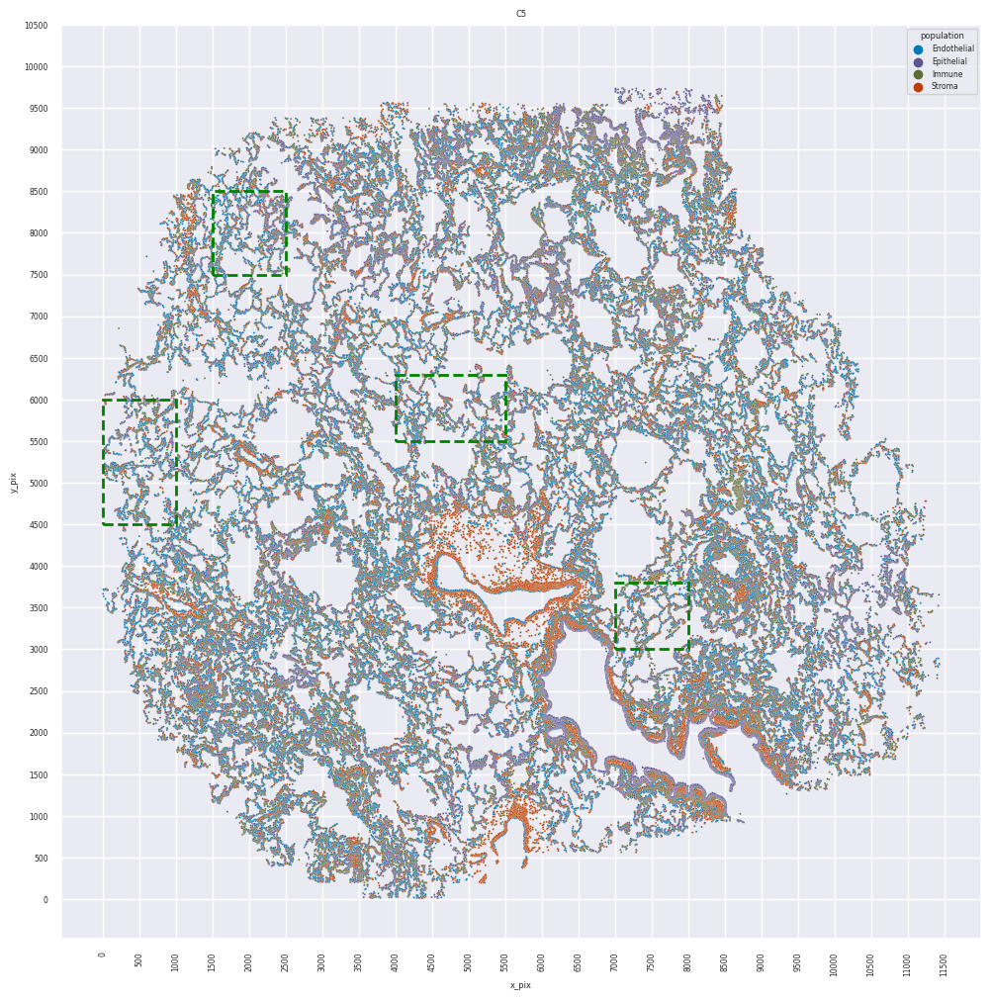

In [3]:
plt.rcParams['figure.figsize'] = [12, 12]
sns.set()
sns.set_style("whitegrid", {"grid.color": "red", "grid.linestyle": "--"})
sns.set(font_scale = 0.5)
ax = sns.scatterplot(x='x_pix', y='y_pix', data=adc5.obs, s=2, hue = "population", palette = scis.io.get_palette("population"))
ax.set_title('C5')
ax.set_xticks(range(0,12000,500))
ax.set_yticks(range(0,11000,500))
ax.tick_params(axis='x', rotation=90)

ax.add_patch(patches.Rectangle((1500, 7500), 1000, 1000, ls='--', edgecolor='green', facecolor='none', linewidth=2))
ax.add_patch(patches.Rectangle((0, 4500), 1000, 1500, ls='--', edgecolor='green', facecolor='none', linewidth=2))
ax.add_patch(patches.Rectangle((4000, 5500), 1500, 800, ls='--', edgecolor='green', facecolor='none', linewidth=2))
ax.add_patch(patches.Rectangle((7000, 3000), 1000, 800, ls='--', edgecolor='green', facecolor='none', linewidth=2))


saving C5_regions.pdf


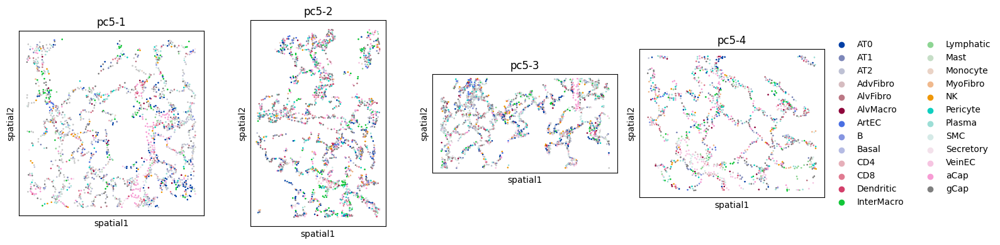

In [4]:
df = pd.DataFrame({'zone': ['pc5-1', 'pc5-2','pc5-3', 'pc5-4'],
        'x': [1500, 0, 4000, 7000],
        'y': [7500, 4500, 5500, 3000],
        'size_x': [1000, 1000, 1500, 1000],
        'size_y': [1000, 1500, 800, 800]})
pC5 = scis.pl.get_regions(adc5,df, save=True, pt_size=2)

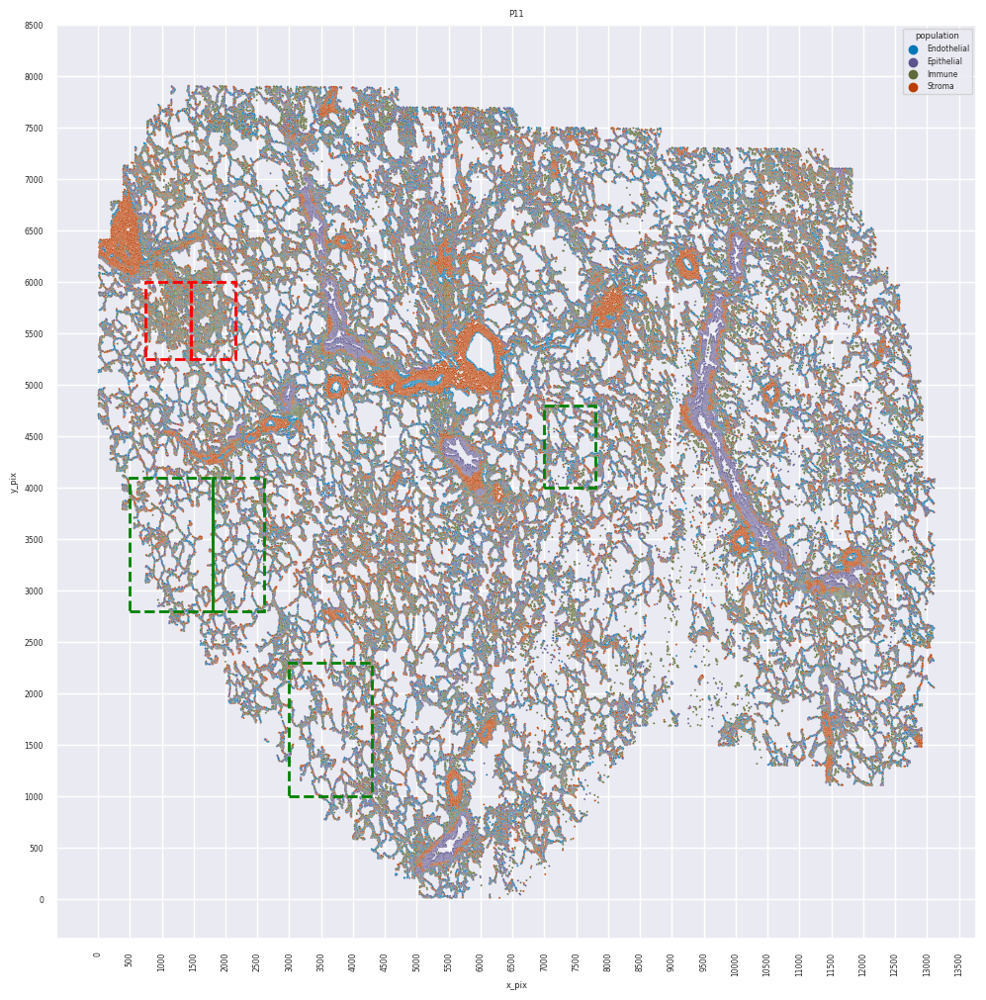

In [5]:
plt.rcParams['figure.figsize'] = [12, 12]
sns.set()
sns.set_style("whitegrid", {"grid.color": "red", "grid.linestyle": "--"})
sns.set(font_scale = 0.5)
ax = sns.scatterplot(x='x_pix', y='y_pix', data=adp11.obs, s=2, hue = "population", palette = scis.io.get_palette("population"))
ax.set_title('P11')
ax.set_xticks(range(0,14000,500))
ax.set_yticks(range(0,9000,500))
ax.tick_params(axis='x', rotation=90)

ax.add_patch(patches.Rectangle((750, 5250), 700, 750, ls='--', edgecolor='red', facecolor='none', linewidth=2))
ax.add_patch(patches.Rectangle((1450, 5250), 700, 750, ls='--', edgecolor='red', facecolor='none', linewidth=2))
ax.add_patch(patches.Rectangle((500, 2800), 1300, 1300, ls='--', edgecolor='green', facecolor='none', linewidth=2))
ax.add_patch(patches.Rectangle((1800, 2800), 800, 1300, ls='--', edgecolor='green', facecolor='none', linewidth=2))
ax.add_patch(patches.Rectangle((3000, 1000), 1300, 1300, ls='--', edgecolor='green', facecolor='none', linewidth=2))
ax.add_patch(patches.Rectangle((7000, 4000), 800, 800, ls='--', edgecolor='green', facecolor='none', linewidth=2))


saving P11_regions.pdf


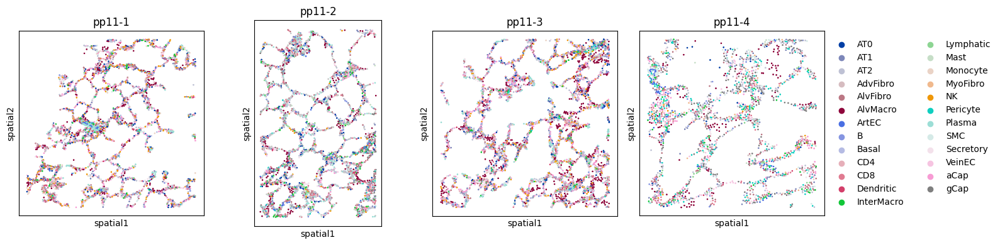

In [6]:
#df = pd.DataFrame({'zone': ['red1', 'red2'],
#        'x': [750, 1450],
#        'y': [5250, 5250],
#        'size_x': [700, 700],
#        'size_y': [750, 750]})
#red = scis.pl.get_regions(adp11,df)

df = pd.DataFrame({'zone': ['pp11-1', 'pp11-2', 'pp11-3', 'pp11-4'],
        'x': [500, 1800, 3000, 7000],
        'y': [2800, 2800, 1000, 4000],
        'size_x': [1300, 800, 1300, 800],
        'size_y': [1300, 1300, 1300, 800]})
pP11 = scis.pl.get_regions(adp11,df,save=True,pt_size=2)

[<Axes: title={'center': 'celltype'}, xlabel='UMAP1', ylabel='UMAP2'>,
 <Axes: title={'center': 'zone'}, xlabel='UMAP1', ylabel='UMAP2'>,
 <Axes: title={'center': 'group'}, xlabel='UMAP1', ylabel='UMAP2'>]

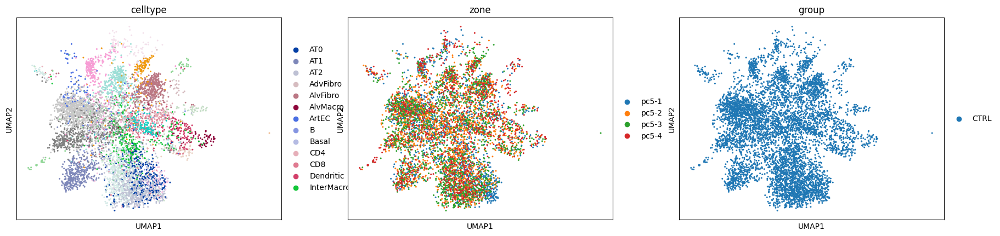

In [9]:
sc.pl.embedding(pC5, "umap", color=['celltype','zone','group'], show=False)

[<Axes: title={'center': 'celltype'}, xlabel='UMAP1', ylabel='UMAP2'>,
 <Axes: title={'center': 'zone'}, xlabel='UMAP1', ylabel='UMAP2'>,
 <Axes: title={'center': 'group'}, xlabel='UMAP1', ylabel='UMAP2'>]

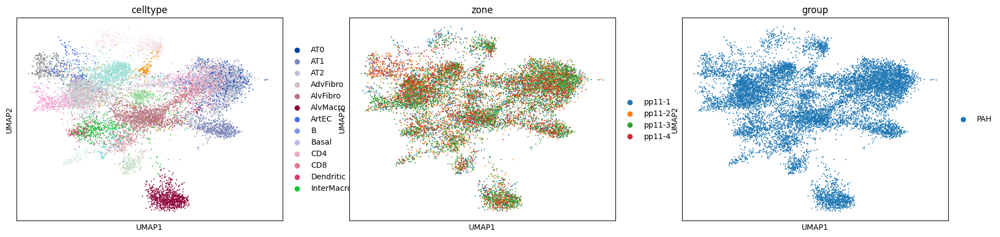

In [10]:
sc.pl.embedding(pP11, "umap", color=['celltype','zone','group'], show=False)

In [11]:
import squidpy as sq

sq.gr.spatial_neighbors(pC5, coord_type="generic")
sq.gr.nhood_enrichment(pC5, cluster_key="celltype")

sq.gr.spatial_neighbors(pP11, coord_type="generic")
sq.gr.nhood_enrichment(pP11, cluster_key="celltype")

  0%|          | 0/1000 [00:00<?, ?/s]

  0%|          | 0/1000 [00:00<?, ?/s]

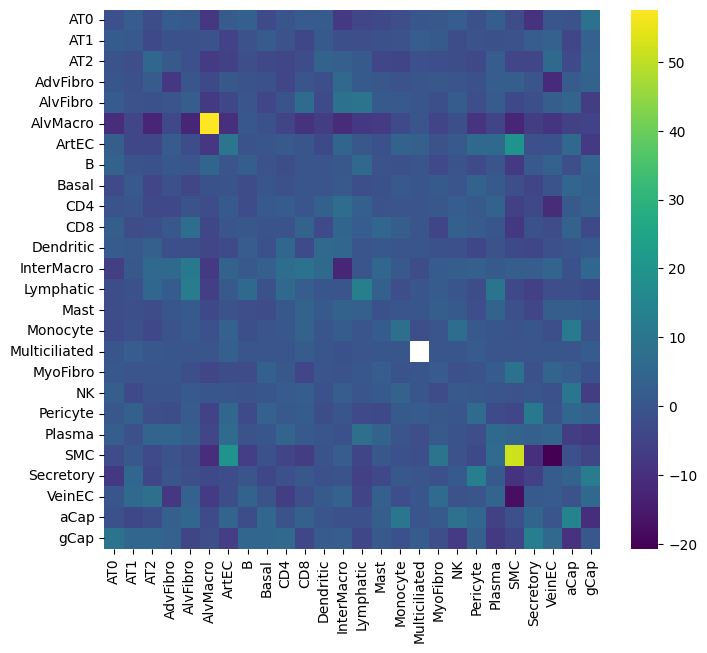

In [12]:
dif = pP11.uns['celltype_nhood_enrichment']['zscore'] - pC5.uns['celltype_nhood_enrichment']['zscore']
dif = pd.DataFrame(dif)
dif.columns = pP11.obs.celltype.cat.categories
dif.index = pC5.obs.celltype.cat.categories
plt.figure(figsize = (8,7))
ax = sns.heatmap(dif, cmap='viridis')

In [13]:
concat = pC5.concatenate(pP11).copy()
df = concat.obs[['zone','celltype','group']]
df

,zone,celltype,group
EntityID,,,
1827746900419100384-0-0-0-0,pc5-1,InterMacro,CTRL
1827746900419100394-0-0-0-0,pc5-1,ArtEC,CTRL
1827746900419100408-0-0-0-0,pc5-1,aCap,CTRL
1827746900419100418-0-0-0-0,pc5-1,AT2,CTRL
1827746900419100434-0-0-0-0,pc5-1,AT1,CTRL
...,...,...,...
1825688600317100489-1-1,pp11-4,AT2,PAH
1825688600317100557-1-1,pp11-4,SMC,PAH
1825688600317100576-1-1,pp11-4,Pericyte,PAH


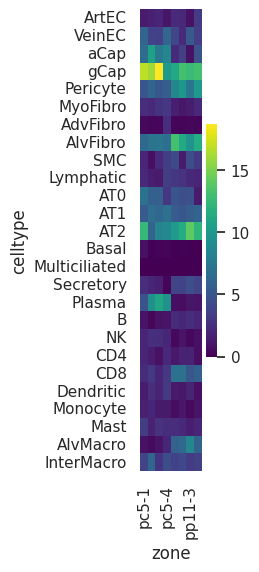

In [9]:
celltype_counts = df.groupby(by=['zone','celltype']).size().unstack().transpose()
celltype_frac = celltype_counts / celltype_counts.sum(axis=0)

celltype_frac = celltype_frac.fillna(0)
lst = ["ArtEC", "VeinEC", "aCap",'gCap','Pericyte','MyoFibro','AdvFibro','AlvFibro','SMC',
       'Lymphatic','AT0','AT1','AT2','Basal','Multiciliated','Secretory','Plasma','B','NK',
       'CD4','CD8','Dendritic','Monocyte','Mast','AlvMacro','InterMacro']
df = celltype_frac.loc[lst]

df = df*100

plt.rcParams['figure.figsize'] = [1, 6]
#colormap = sns.color_palette("Reds")
colormap = sns.color_palette("flare", as_cmap=True)
sns.heatmap(df,cmap='viridis')
plt.savefig('prop_zone.pdf')


[<Axes: title={'center': 'celltype'}, xlabel='UMAP1', ylabel='UMAP2'>,
 <Axes: title={'center': 'zone'}, xlabel='UMAP1', ylabel='UMAP2'>,
 <Axes: title={'center': 'group'}, xlabel='UMAP1', ylabel='UMAP2'>]

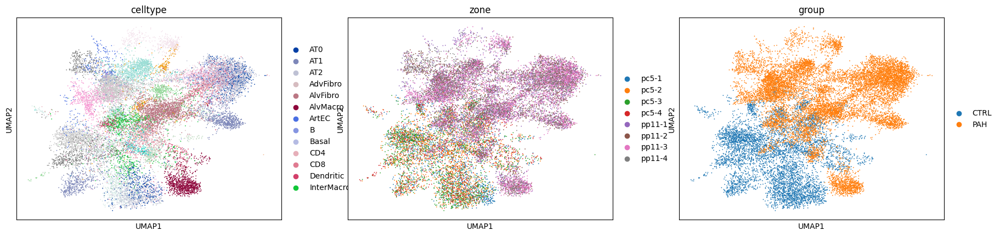

In [14]:
sc.pl.embedding(concat, "umap", color=['celltype','zone','group'], show=False)

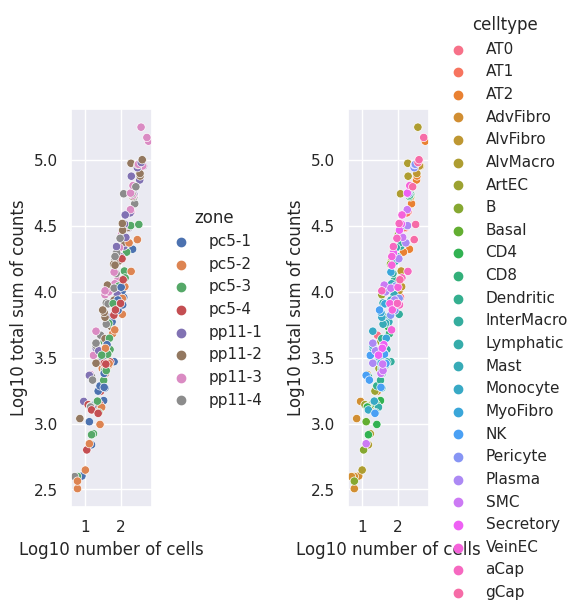

In [11]:
# https://decoupler-py.readthedocs.io/en/latest/notebooks/pseudobulk.html

sns.set(font_scale = 1)

pdata = dc.get_pseudobulk(
    concat,
    sample_col='zone',
    groups_col='celltype',
    layer='counts',
    mode='sum',
    min_cells=5,
    min_counts=200
)
dc.plot_psbulk_samples(pdata, groupby=['zone', 'celltype'], figsize=(6, 6))

Fitting size factors...
... done in 0.00 seconds.

Fitting dispersions...
... done in 0.12 seconds.

Fitting dispersion trend curve...
... done in 0.05 seconds.

Fitting MAP dispersions...
... done in 0.10 seconds.

Fitting LFCs...
... done in 0.07 seconds.

Refitting 0 outliers.

Running Wald tests...
... done in 0.07 seconds.

Log2 fold change & Wald test p-value: group CTRL vs PAH


,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
ACOXL,26.413864,-0.980032,0.251612,-3.895010,9.819461e-05,2.192252e-04
ACP5,29.263639,-0.487908,0.270070,-1.806598,7.082500e-02,1.030182e-01
ACVR1,22.920929,0.006678,0.209471,0.031881,9.745668e-01,9.848254e-01
ACVR1B,54.709049,2.800993,0.389434,7.192475,6.362710e-13,3.393445e-12
APP,267.176697,-0.410272,0.117657,-3.487030,4.884168e-04,1.019305e-03
...,...,...,...,...,...,...
TP53,46.574677,-0.286726,0.191861,-1.494449,1.350583e-01,1.800777e-01
TXNDC5,43.935345,-1.637451,0.253080,-6.470104,9.793577e-11,4.477064e-10
VWF,72.266205,0.899120,0.351142,2.560564,1.045024e-02,1.929275e-02
WNT5A,21.739120,1.376477,0.266310,5.168713,2.357121e-07,7.299472e-07


Fitting MAP LFCs...
... done in 0.08 seconds.

Shrunk Log2 fold change & Wald test p-value: group PAH vs CTRL


,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
ACOXL,26.413864,0.929623,0.248906,-3.895010,9.819461e-05,2.192252e-04
ACP5,29.263639,0.446983,0.266793,-1.806598,7.082500e-02,1.030182e-01
ACVR1,22.920929,-0.144270,0.832772,0.031881,9.745668e-01,9.848254e-01
ACVR1B,54.709049,-2.707731,0.388936,7.192475,6.362710e-13,3.393445e-12
APP,267.176697,0.403329,0.117444,-3.487030,4.884168e-04,1.019305e-03
...,...,...,...,...,...,...
TP53,46.574677,0.273867,0.190556,-1.494449,1.350583e-01,1.800777e-01
TXNDC5,43.935345,1.585329,0.252166,-6.470104,9.793577e-11,4.477064e-10
VWF,72.266205,-0.798810,0.349998,2.560564,1.045024e-02,1.929275e-02
WNT5A,21.739120,-1.316564,0.265690,5.168713,2.357121e-07,7.299472e-07


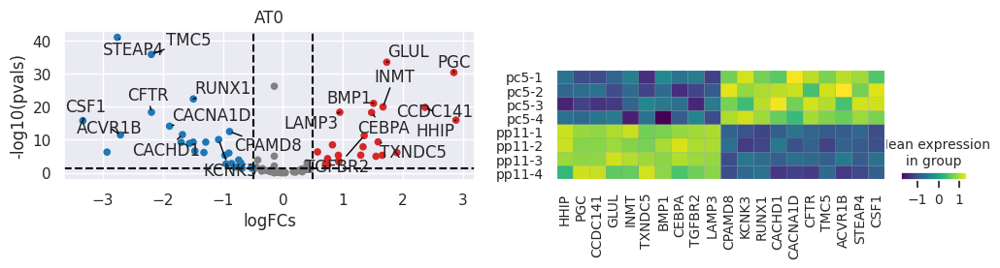

Fitting size factors...
... done in 0.00 seconds.

Fitting dispersions...
... done in 0.16 seconds.

Fitting dispersion trend curve...
... done in 0.07 seconds.

Fitting MAP dispersions...
... done in 0.16 seconds.

Fitting LFCs...
... done in 0.10 seconds.

Refitting 0 outliers.

Running Wald tests...
... done in 0.12 seconds.

Log2 fold change & Wald test p-value: group CTRL vs PAH


,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
ACP5,35.405251,-1.080258,0.275354,-3.923158,8.739569e-05,2.048784e-04
ACVR1,28.873867,-0.139023,0.242643,-0.572955,5.666755e-01,6.281751e-01
ACVR1B,29.657501,0.985731,0.258335,3.815703,1.357957e-04,3.082347e-04
ACVRL1,42.823708,0.906968,0.229205,3.957013,7.589268e-05,1.871147e-04
ADAM10,22.569384,0.022135,0.321963,0.068749,9.451895e-01,9.637014e-01
...,...,...,...,...,...,...
VCAN,25.202028,-0.916093,0.252907,-3.622252,2.920491e-04,6.052611e-04
VWF,242.023499,-0.009443,0.152139,-0.062069,9.505079e-01,9.637014e-01
WNT3A,97.688385,0.661415,0.115657,5.718742,1.073153e-08,4.513557e-08
WNT5A,34.971176,-0.228055,0.193303,-1.179778,2.380884e-01,2.986548e-01


Fitting MAP LFCs...
... done in 0.12 seconds.

Shrunk Log2 fold change & Wald test p-value: group PAH vs CTRL


,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
ACP5,35.405251,1.006102,0.273435,-3.923158,8.739569e-05,2.048784e-04
ACVR1,28.873867,0.124992,0.238868,-0.572955,5.666755e-01,6.281751e-01
ACVR1B,29.657501,-0.919051,0.259063,3.815703,1.357957e-04,3.082347e-04
ACVRL1,42.823708,-0.855042,0.229215,3.957013,7.589268e-05,1.871147e-04
ADAM10,22.569384,-0.017745,0.312123,0.068749,9.451895e-01,9.637014e-01
...,...,...,...,...,...,...
VCAN,25.202028,-0.144270,0.880948,-3.622252,2.920491e-04,6.052611e-04
VWF,242.023499,0.009247,0.150460,-0.062069,9.505079e-01,9.637014e-01
WNT3A,97.688385,-0.648894,0.115698,5.718742,1.073153e-08,4.513557e-08
WNT5A,34.971176,-0.144270,0.880948,-1.179778,2.380884e-01,2.986548e-01


<Figure size 100x600 with 0 Axes>

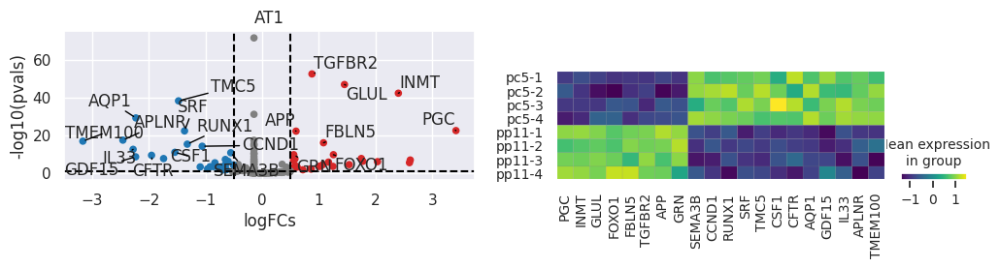

Fitting size factors...
... done in 0.00 seconds.

Fitting dispersions...
... done in 0.17 seconds.

Fitting dispersion trend curve...
... done in 0.06 seconds.

Fitting MAP dispersions...
... done in 0.17 seconds.

Fitting LFCs...
... done in 0.12 seconds.

Refitting 0 outliers.

Running Wald tests...
... done in 0.12 seconds.

Log2 fold change & Wald test p-value: group CTRL vs PAH


,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
ACOXL,83.057976,-0.613819,0.175405,-3.499438,4.662402e-04,1.028283e-03
ACP5,76.751007,-0.380178,0.192743,-1.972463,4.855677e-02,7.516962e-02
ACVR1,66.798157,0.228881,0.175023,1.307718,1.909690e-01,2.520164e-01
ACVR1B,111.718765,2.304735,0.235722,9.777338,1.408665e-22,1.417469e-21
ACVRL1,36.421860,0.469414,0.262079,1.791112,7.327540e-02,1.072485e-01
...,...,...,...,...,...,...
VCAN,23.651491,-0.800741,0.381530,-2.098762,3.583785e-02,5.712767e-02
VWF,203.997650,-0.188979,0.175747,-1.075290,2.822448e-01,3.578063e-01
WNT3A,37.819668,0.509539,0.213996,2.381067,1.726255e-02,2.988464e-02
WNT5A,38.179382,0.266789,0.276702,0.964177,3.349573e-01,4.113119e-01


Fitting MAP LFCs...
... done in 0.12 seconds.

Shrunk Log2 fold change & Wald test p-value: group PAH vs CTRL


,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
ACOXL,83.057976,0.590869,0.174370,-3.499438,4.662402e-04,1.028283e-03
ACP5,76.751007,0.360503,0.191296,-1.972463,4.855677e-02,7.516962e-02
ACVR1,66.798157,-0.217955,0.173888,1.307718,1.909690e-01,2.520164e-01
ACVR1B,111.718765,-2.264199,0.237438,9.777338,1.408665e-22,1.417469e-21
ACVRL1,36.421860,-0.426814,0.259044,1.791112,7.327540e-02,1.072485e-01
...,...,...,...,...,...,...
VCAN,23.651491,0.683673,0.374710,-2.098762,3.583785e-02,5.712767e-02
VWF,203.997650,0.180277,0.173937,-1.075290,2.822448e-01,3.578063e-01
WNT3A,37.819668,-0.478221,0.213802,2.381067,1.726255e-02,2.988464e-02
WNT5A,38.179382,-0.237337,0.272174,0.964177,3.349573e-01,4.113119e-01


<Figure size 100x600 with 0 Axes>

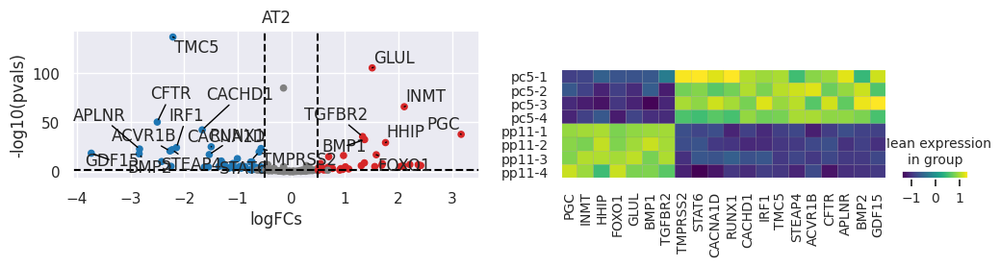

Fitting size factors...
... done in 0.00 seconds.

Fitting dispersions...
... done in 0.03 seconds.

Fitting dispersion trend curve...
... done in 0.04 seconds.

Fitting MAP dispersions...
... done in 0.03 seconds.

Fitting LFCs...
... done in 0.01 seconds.

Refitting 0 outliers.

Running Wald tests...
... done in 0.01 seconds.

Log2 fold change & Wald test p-value: group CTRL vs PAH


,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
APP,33.033703,-0.101940,0.375236,-0.271670,0.785876,0.785876
CCDC80,21.217642,1.194535,0.534420,2.235198,0.025404,0.045728
CCN2,31.914312,1.975623,0.654615,3.017991,0.002545,0.006275
ENG,19.953245,1.799463,0.575631,3.126070,0.001772,0.006275
FBLN5,39.977341,-0.113583,0.280415,-0.405053,0.685439,0.771118
GLUL,25.741661,-1.472846,0.492573,-2.990106,0.002789,0.006275
INMT,24.804176,-1.858856,0.558934,-3.325717,0.000882,0.006275
MYH11,23.036354,-1.151332,0.988908,-1.164245,0.244325,0.314132
TGFBR2,18.731409,-0.863837,0.577244,-1.496484,0.134527,0.201791


Fitting MAP LFCs...
... done in 0.01 seconds.

Shrunk Log2 fold change & Wald test p-value: group PAH vs CTRL


,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
APP,33.033703,0.085570,0.359988,-0.271670,0.785876,0.785876
CCDC80,21.217642,-0.958112,0.526246,2.235198,0.025404,0.045728
CCN2,31.914312,-1.628252,0.669431,3.017991,0.002545,0.006275
ENG,19.953245,-1.520647,0.589692,3.126070,0.001772,0.006275
FBLN5,39.977341,0.101502,0.270976,-0.405053,0.685439,0.771118
GLUL,25.741661,1.262523,0.501274,-2.990106,0.002789,0.006275
INMT,24.804176,1.605948,0.565581,-3.325717,0.000882,0.006275
MYH11,23.036354,0.523965,0.885809,-1.164245,0.244325,0.314132
TGFBR2,18.731409,0.631468,0.553724,-1.496484,0.134527,0.201791


<Figure size 100x600 with 0 Axes>

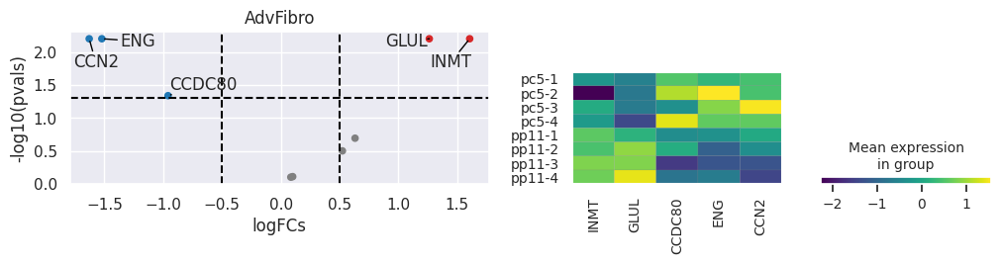

Fitting size factors...
... done in 0.00 seconds.

Fitting dispersions...
... done in 0.18 seconds.

Fitting dispersion trend curve...
... done in 0.08 seconds.

Fitting MAP dispersions...
... done in 0.18 seconds.

Fitting LFCs...
... done in 0.10 seconds.

Refitting 0 outliers.

Running Wald tests...
... done in 0.09 seconds.

Log2 fold change & Wald test p-value: group CTRL vs PAH


,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
ACP5,33.219891,0.286921,0.233970,1.226317,2.200795e-01,3.030325e-01
ACVR1,58.429539,-0.398562,0.213277,-1.868750,6.165754e-02,9.766990e-02
ACVR1B,84.272568,-0.106501,0.200551,-0.531041,5.953905e-01,6.920449e-01
ACVR2B,18.554867,-0.062252,0.340746,-0.182692,8.550396e-01,8.846941e-01
ACVRL1,92.527115,0.192541,0.185135,1.040005,2.983374e-01,3.955733e-01
...,...,...,...,...,...,...
VWF,388.758209,0.856615,0.281667,3.041236,2.356090e-03,4.686000e-03
WNT3A,30.506731,0.820633,0.218607,3.753920,1.740904e-04,4.154958e-04
WNT5A,23.010948,0.164954,0.315335,0.523108,6.008992e-01,6.939416e-01
YAP1,506.800598,-0.415948,0.079277,-5.246776,1.547835e-07,5.227595e-07


Fitting MAP LFCs...
... done in 0.09 seconds.

Shrunk Log2 fold change & Wald test p-value: group PAH vs CTRL


,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
ACP5,33.219891,-0.261454,0.232702,1.226317,2.200795e-01,3.030325e-01
ACVR1,58.429539,0.371870,0.211510,-1.868750,6.165754e-02,9.766990e-02
ACVR1B,84.272568,0.099482,0.198987,-0.531041,5.953905e-01,6.920449e-01
ACVR2B,18.554867,0.051833,0.332069,-0.182692,8.550396e-01,8.846941e-01
ACVRL1,92.527115,-0.181155,0.182609,1.040005,2.983374e-01,3.955733e-01
...,...,...,...,...,...,...
VWF,388.758209,-0.785004,0.279708,3.041236,2.356090e-03,4.686000e-03
WNT3A,30.506731,-0.773723,0.219876,3.753920,1.740904e-04,4.154958e-04
WNT5A,23.010948,-0.138940,0.309717,0.523108,6.008992e-01,6.939416e-01
YAP1,506.800598,0.411592,0.079102,-5.246776,1.547835e-07,5.227595e-07


<Figure size 100x600 with 0 Axes>

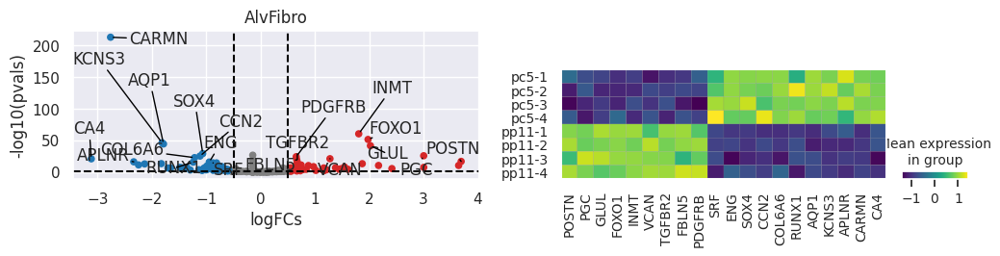

Fitting size factors...
... done in 0.00 seconds.

Fitting dispersions...
... done in 0.14 seconds.

Fitting dispersion trend curve...
... done in 0.05 seconds.

Fitting MAP dispersions...
... done in 0.12 seconds.

Fitting LFCs...
... done in 0.09 seconds.

Refitting 0 outliers.

Running Wald tests...
... done in 0.09 seconds.

Log2 fold change & Wald test p-value: group CTRL vs PAH


,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
ACP5,208.554123,-2.035484,0.263957,-7.711434,1.244119e-14,1.919498e-13
ACVR1,13.842313,0.495751,0.516473,0.959878,3.371164e-01,4.443798e-01
ACVR1B,43.664108,1.484382,0.306988,4.835305,1.329413e-06,7.556666e-06
ACVRL1,25.331551,-2.014924,0.662153,-3.042989,2.342405e-03,6.837291e-03
ADAM10,26.525114,2.127490,0.351546,6.051803,1.432339e-09,1.289105e-08
...,...,...,...,...,...,...
TYROBP,165.245270,-1.924218,0.257749,-7.465460,8.300897e-14,1.120621e-12
VCAN,12.797224,1.227364,0.541700,2.265765,2.346578e-02,5.068609e-02
VWF,46.965527,1.769991,0.382611,4.626082,3.726480e-06,1.916475e-05
WNT3A,62.700294,3.006493,0.286825,10.481971,1.045424e-25,1.129058e-23


Fitting MAP LFCs...
... done in 0.09 seconds.

Shrunk Log2 fold change & Wald test p-value: group PAH vs CTRL


,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
ACP5,208.554123,1.994129,0.260090,-7.711434,1.244119e-14,1.919498e-13
ACVR1,13.842313,-0.395961,0.532624,0.959878,3.371164e-01,4.443798e-01
ACVR1B,43.664108,-1.417308,0.311252,4.835305,1.329413e-06,7.556666e-06
ACVRL1,25.331551,1.742699,0.608454,-3.042989,2.342405e-03,6.837291e-03
ADAM10,26.525114,-2.044299,0.358614,6.051803,1.432339e-09,1.289105e-08
...,...,...,...,...,...,...
TYROBP,165.245270,1.877277,0.254121,-7.465460,8.300897e-14,1.120621e-12
VCAN,12.797224,-1.024735,0.563929,2.265765,2.346578e-02,5.068609e-02
VWF,46.965527,-1.667274,0.385997,4.626082,3.726480e-06,1.916475e-05
WNT3A,62.700294,-2.961149,0.288149,10.481971,1.045424e-25,1.129058e-23


<Figure size 100x600 with 0 Axes>

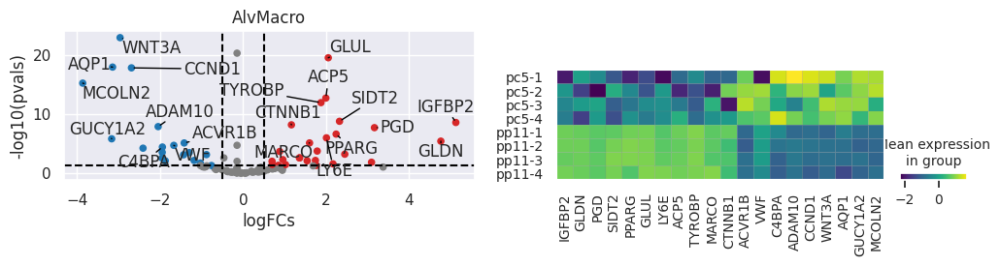

Fitting size factors...
... done in 0.00 seconds.

Fitting dispersions...
... done in 0.08 seconds.

Fitting dispersion trend curve...
... done in 0.04 seconds.

Fitting MAP dispersions...
... done in 0.07 seconds.

Fitting LFCs...
... done in 0.05 seconds.

Refitting 0 outliers.

Running Wald tests...
... done in 0.05 seconds.

Log2 fold change & Wald test p-value: group CTRL vs PAH


,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
ACVRL1,81.227036,-0.030385,0.297447,-0.102153,9.186352e-01,9.302275e-01
APLNR,35.785419,3.977639,0.413152,9.627548,6.117143e-22,2.049243e-20
APP,320.709106,-0.918964,0.172406,-5.330245,9.808016e-08,5.054901e-07
AQP1,356.166809,2.107147,0.296418,7.108712,1.171305e-12,1.307957e-11
BMP4,27.939615,1.536326,0.392857,3.910654,9.204660e-05,2.371970e-04
...,...,...,...,...,...,...
TGFBR2,135.019943,0.789248,0.218664,3.609402,3.069035e-04,6.854178e-04
TMEM100,215.398911,1.594702,0.311920,5.112536,3.178630e-07,1.521201e-06
TXNDC5,22.195761,-2.894981,0.525115,-5.513040,3.526888e-08,2.148196e-07
VWF,355.735321,0.493160,0.262245,1.880530,6.003592e-02,9.577158e-02


Fitting MAP LFCs...
... done in 0.06 seconds.

Shrunk Log2 fold change & Wald test p-value: group PAH vs CTRL


,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
ACVRL1,81.227036,0.027402,0.290957,-0.102153,9.186352e-01,9.302275e-01
APLNR,35.785419,-3.897198,0.416183,9.627548,6.117143e-22,2.049243e-20
APP,320.709106,0.897527,0.172481,-5.330245,9.808016e-08,5.054901e-07
AQP1,356.166809,-2.047357,0.297419,7.108712,1.171305e-12,1.307957e-11
BMP4,27.939615,-1.415317,0.395955,3.910654,9.204660e-05,2.371970e-04
...,...,...,...,...,...,...
TGFBR2,135.019943,-0.756340,0.218589,3.609402,3.069035e-04,6.854178e-04
TMEM100,215.398911,-1.519424,0.312376,5.112536,3.178630e-07,1.521201e-06
TXNDC5,22.195761,2.738523,0.505668,-5.513040,3.526888e-08,2.148196e-07
VWF,355.735321,-0.458867,0.258737,1.880530,6.003592e-02,9.577158e-02


<Figure size 100x600 with 0 Axes>

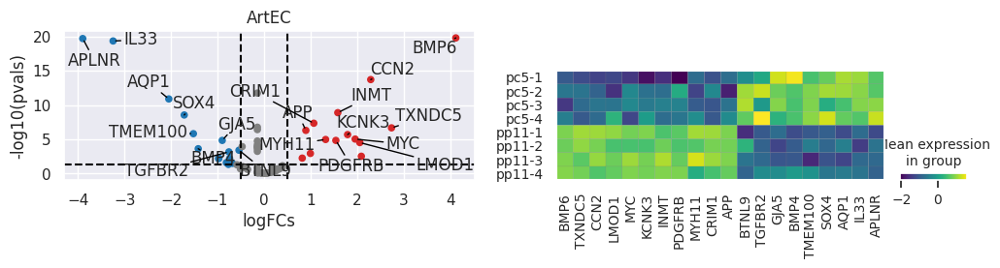

Fitting size factors...
... done in 0.00 seconds.

Fitting dispersions...
... done in 0.09 seconds.

Fitting dispersion trend curve...
... done in 0.05 seconds.

Fitting MAP dispersions...
... done in 0.09 seconds.

Fitting LFCs...
... done in 0.06 seconds.

Refitting 0 outliers.

Running Wald tests...
... done in 0.06 seconds.

Log2 fold change & Wald test p-value: group CTRL vs PAH


,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
ACP5,9.542459,-2.215527,0.728443,-3.041456,0.002354,0.005572
ACVRL1,14.493731,1.502714,0.314852,4.772768,0.000002,0.000009
APP,152.271133,-0.127875,0.120856,-1.058082,0.290018,0.343188
AQP1,96.954773,-0.490365,0.199931,-2.452667,0.014180,0.026494
ARFGEF3,46.432034,-0.306396,0.215951,-1.418819,0.155952,0.201320
...,...,...,...,...,...,...
TMPRSS2,46.300274,-0.233938,0.313344,-0.746586,0.455313,0.509918
TP53,19.537636,0.597720,0.296009,2.019264,0.043460,0.073468
TXNDC5,16.406776,-0.490421,0.377919,-1.297687,0.194395,0.233933
VWF,73.154984,-0.709582,0.362689,-1.956446,0.050413,0.079540


Fitting MAP LFCs...
... done in 0.06 seconds.

Shrunk Log2 fold change & Wald test p-value: group PAH vs CTRL


,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
ACP5,9.542459,1.842924,0.643865,-3.041456,0.002354,0.005572
ACVRL1,14.493731,-1.426672,0.320727,4.772768,0.000002,0.000009
APP,152.271133,0.126341,0.120781,-1.058082,0.290018,0.343188
AQP1,96.954773,0.474389,0.198064,-2.452667,0.014180,0.026494
ARFGEF3,46.432034,0.288879,0.214482,-1.418819,0.155952,0.201320
...,...,...,...,...,...,...
TMPRSS2,46.300274,0.213628,0.305336,-0.746586,0.455313,0.509918
TP53,19.537636,-0.144270,1.249225,2.019264,0.043460,0.073468
TXNDC5,16.406776,0.433720,0.370520,-1.297687,0.194395,0.233933
VWF,73.154984,0.637902,0.355354,-1.956446,0.050413,0.079540


<Figure size 100x600 with 0 Axes>

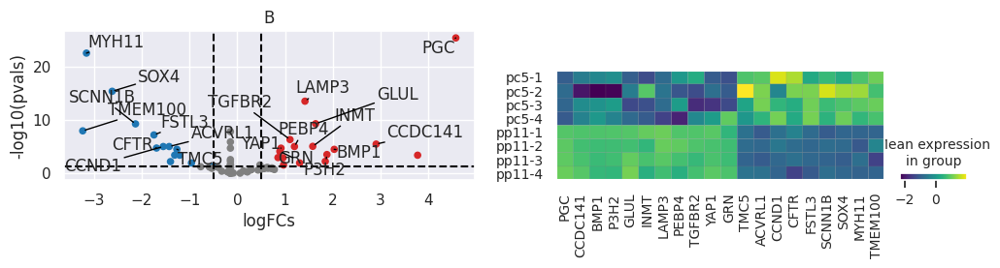

Fitting size factors...
... done in 0.00 seconds.

Fitting dispersions...
... done in 0.03 seconds.

Fitting dispersion trend curve...
... done in 0.08 seconds.

Fitting MAP dispersions...
... done in 0.03 seconds.

Fitting LFCs...
... done in 0.01 seconds.

Refitting 0 outliers.

Running Wald tests...
... done in 0.02 seconds.

Log2 fold change & Wald test p-value: group CTRL vs PAH


,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
APP,78.603447,-0.820675,0.182222,-4.503719,6.677445e-06,1.669361e-05
CCL5,88.550835,1.785971,0.193841,9.213599,3.153684e-20,2.365263e-19
CTNNB1,55.554062,-0.414654,0.206826,-2.004838,4.498041e-02,5.622551e-02
ENG,39.724644,0.350512,0.167354,2.094438,3.622096e-02,4.939221e-02
FBLN5,35.343609,-1.262494,0.271109,-4.656768,3.212118e-06,9.636353e-06
FOXO1,43.437000,-0.788933,0.209155,-3.772001,1.619433e-04,3.036437e-04
GLUL,63.702446,-1.528763,0.180162,-8.485501,2.147913e-17,8.054673e-17
GRN,34.907063,-0.117666,0.200520,-0.586806,5.573343e-01,NaN
INMT,59.877071,-2.500587,0.290606,-8.604734,7.649414e-18,3.824707e-17
ITK,53.024456,-0.250353,0.167095,-1.498269,1.340635e-01,1.340635e-01


Fitting MAP LFCs...
... done in 0.02 seconds.

Shrunk Log2 fold change & Wald test p-value: group PAH vs CTRL


,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
APP,78.603447,0.788339,0.181437,-4.503719,6.677445e-06,1.669361e-05
CCL5,88.550835,-1.753004,0.194723,9.213599,3.153684e-20,2.365263e-19
CTNNB1,55.554062,0.385957,0.205246,-2.004838,4.498041e-02,5.622551e-02
ENG,39.724644,-0.144270,0.880273,2.094438,3.622096e-02,4.939221e-02
FBLN5,35.343609,1.190622,0.268381,-4.656768,3.212118e-06,9.636353e-06
FOXO1,43.437000,0.747077,0.207270,-3.772001,1.619433e-04,3.036437e-04
GLUL,63.702446,1.505832,0.179024,-8.485501,2.147913e-17,8.054673e-17
GRN,34.907063,0.110037,0.198397,-0.586806,5.573343e-01,NaN
INMT,59.877071,2.442810,0.288015,-8.604734,7.649414e-18,3.824707e-17
ITK,53.024456,0.238496,0.166044,-1.498269,1.340635e-01,1.340635e-01


<Figure size 100x600 with 0 Axes>

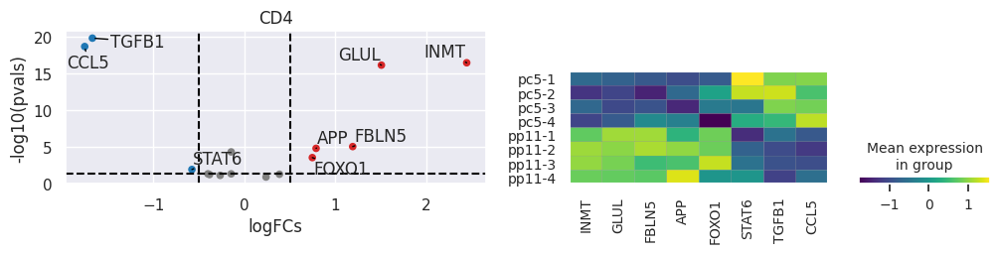

Fitting size factors...
... done in 0.00 seconds.

Fitting dispersions...
... done in 0.15 seconds.

Fitting dispersion trend curve...
... done in 0.06 seconds.

Fitting MAP dispersions...
... done in 0.15 seconds.

Fitting LFCs...
... done in 0.10 seconds.

Refitting 0 outliers.

Running Wald tests...
... done in 0.11 seconds.

Log2 fold change & Wald test p-value: group CTRL vs PAH


,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
ACOXL,17.412054,-1.200761,0.422927,-2.839165,4.523180e-03,7.356980e-03
ACP5,23.708612,-0.121783,0.287138,-0.424126,6.714738e-01,7.081950e-01
ACVR1,20.990364,-0.304937,0.327802,-0.930246,3.522438e-01,4.204343e-01
ACVR1B,26.679403,1.119957,0.291499,3.842056,1.220078e-04,2.721019e-04
ACVRL1,50.209709,1.846143,0.331564,5.567981,2.577080e-08,8.485508e-08
...,...,...,...,...,...,...
TYROBP,21.314138,1.170436,0.304788,3.840169,1.229497e-04,2.721019e-04
VCAN,29.125587,-1.141630,0.360231,-3.169164,1.528781e-03,2.751806e-03
VWF,183.302185,2.848022,0.177091,16.082277,3.396589e-58,9.170791e-57
WNT3A,14.254818,1.123129,0.323502,3.471788,5.170053e-04,9.970816e-04


Fitting MAP LFCs...
... done in 0.10 seconds.

Shrunk Log2 fold change & Wald test p-value: group PAH vs CTRL


,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
ACOXL,17.412054,-0.144270,1.254080,-2.839165,4.523180e-03,7.356980e-03
ACP5,23.708612,0.108932,0.285345,-0.424126,6.714738e-01,7.081950e-01
ACVR1,20.990364,0.277375,0.324334,-0.930246,3.522438e-01,4.204343e-01
ACVR1B,26.679403,-1.062496,0.293194,3.842056,1.220078e-04,2.721019e-04
ACVRL1,50.209709,-1.770588,0.333009,5.567981,2.577080e-08,8.485508e-08
...,...,...,...,...,...,...
TYROBP,21.314138,-1.106699,0.307981,3.840169,1.229497e-04,2.721019e-04
VCAN,29.125587,1.058088,0.353405,-3.169164,1.528781e-03,2.751806e-03
VWF,183.302185,-2.830377,0.177410,16.082277,3.396589e-58,9.170791e-57
WNT3A,14.254818,-0.144270,1.254080,3.471788,5.170053e-04,9.970816e-04


<Figure size 100x600 with 0 Axes>

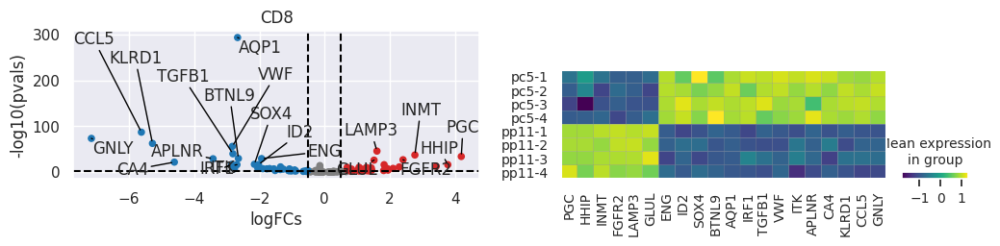

Fitting size factors...
... done in 0.00 seconds.

Fitting dispersions...
... done in 0.04 seconds.

Fitting dispersion trend curve...
... done in 0.08 seconds.

Fitting MAP dispersions...
... done in 0.04 seconds.

Fitting LFCs...
... done in 0.02 seconds.

Refitting 0 outliers.

Running Wald tests...
... done in 0.02 seconds.

Log2 fold change & Wald test p-value: group CTRL vs PAH


,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
ANPEP,42.730091,1.245341,0.154696,8.050250,8.262540e-16,9.931117e-15
APOE,35.147728,1.112994,0.767303,1.450526,1.469118e-01,2.028782e-01
APP,124.409111,-0.176503,0.130900,-1.348382,1.775356e-01,2.340242e-01
AQP1,65.463615,1.509005,0.258673,5.833628,5.423502e-09,3.145631e-08
CIITA,101.960587,0.297127,0.101737,2.920531,3.494353e-03,7.238302e-03
CTNNB1,82.208138,-0.698693,0.215193,-3.246821,1.167019e-03,2.603350e-03
ENG,70.756599,1.008270,0.217125,4.643733,3.421693e-06,1.240364e-05
FBLN5,45.560341,-0.082094,0.330156,-0.248653,8.036295e-01,8.631576e-01
FOXO1,22.166512,-0.973148,0.271310,-3.586847,3.347005e-04,8.088596e-04
GLUL,135.670242,-1.254206,0.156316,-8.023546,1.027357e-15,9.931117e-15


Fitting MAP LFCs...
... done in 0.02 seconds.

Shrunk Log2 fold change & Wald test p-value: group PAH vs CTRL


,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
ANPEP,42.730091,-0.144270,0.747915,8.050250,8.262540e-16,9.931117e-15
APOE,35.147728,-0.453424,0.651689,1.450526,1.469118e-01,2.028782e-01
APP,124.409111,0.167499,0.129897,-1.348382,1.775356e-01,2.340242e-01
AQP1,65.463615,-1.435510,0.261993,5.833628,5.423502e-09,3.145631e-08
CIITA,101.960587,-0.144270,0.747915,2.920531,3.494353e-03,7.238302e-03
CTNNB1,82.208138,0.642471,0.214241,-3.246821,1.167019e-03,2.603350e-03
ENG,70.756599,-0.949207,0.217518,4.643733,3.421693e-06,1.240364e-05
FBLN5,45.560341,0.061221,0.307952,-0.248653,8.036295e-01,8.631576e-01
FOXO1,22.166512,0.882262,0.267161,-3.586847,3.347005e-04,8.088596e-04
GLUL,135.670242,1.226333,0.156060,-8.023546,1.027357e-15,9.931117e-15


<Figure size 100x600 with 0 Axes>

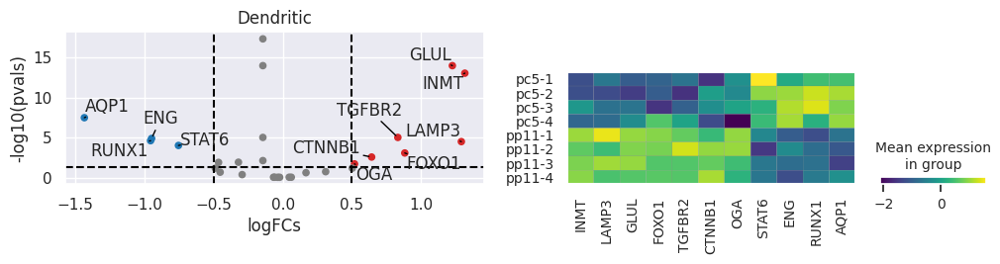

Fitting size factors...
... done in 0.00 seconds.

Fitting dispersions...
... done in 0.13 seconds.

Fitting dispersion trend curve...
... done in 0.05 seconds.

Fitting MAP dispersions...
... done in 0.12 seconds.

Fitting LFCs...
... done in 0.09 seconds.

Refitting 0 outliers.

Running Wald tests...
... done in 0.09 seconds.

Log2 fold change & Wald test p-value: group CTRL vs PAH


,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
ACP5,26.766546,0.164071,0.263227,0.623305,5.330840e-01,6.100240e-01
ACVR1B,58.597767,2.560113,0.223534,11.452878,2.274652e-30,2.805404e-29
ACVRL1,22.354027,0.064349,0.325139,0.197912,8.431136e-01,8.665335e-01
ADGRG6,18.926056,-0.127694,0.328605,-0.388595,6.975760e-01,7.591268e-01
ANPEP,24.686794,0.073515,0.339736,0.216387,8.286857e-01,8.665335e-01
...,...,...,...,...,...,...
TYROBP,42.777187,-1.226994,0.268128,-4.576150,4.736110e-06,1.168240e-05
VCAN,34.256992,-1.127499,0.440250,-2.561044,1.043583e-02,1.586818e-02
VWF,81.571404,0.528470,0.349833,1.510637,1.308810e-01,1.689278e-01
WNT3A,25.551407,2.712524,0.363394,7.464410,8.367352e-14,4.221709e-13


Fitting MAP LFCs...
... done in 0.09 seconds.

Shrunk Log2 fold change & Wald test p-value: group PAH vs CTRL


,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
ACP5,26.766546,-0.153344,0.262158,0.623305,5.330840e-01,6.100240e-01
ACVR1B,58.597767,-2.530469,0.222853,11.452878,2.274652e-30,2.805404e-29
ACVRL1,22.354027,-0.057817,0.323865,0.197912,8.431136e-01,8.665335e-01
ADGRG6,18.926056,0.115902,0.323865,-0.388595,6.975760e-01,7.591268e-01
ANPEP,24.686794,-0.065469,0.334469,0.216387,8.286857e-01,8.665335e-01
...,...,...,...,...,...,...
TYROBP,42.777187,1.178682,0.266189,-4.576150,4.736110e-06,1.168240e-05
VCAN,34.256992,1.004228,0.432435,-2.561044,1.043583e-02,1.586818e-02
VWF,81.571404,-0.477014,0.342283,1.510637,1.308810e-01,1.689278e-01
WNT3A,25.551407,-2.634567,0.364965,7.464410,8.367352e-14,4.221709e-13


<Figure size 100x600 with 0 Axes>

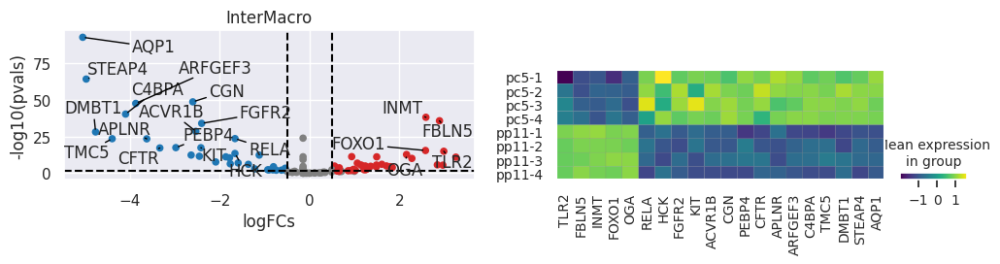

Fitting size factors...
... done in 0.00 seconds.

Fitting dispersions...
... done in 0.07 seconds.

Fitting dispersion trend curve...
... done in 0.04 seconds.

Fitting MAP dispersions...
... done in 0.07 seconds.

Fitting LFCs...
... done in 0.05 seconds.

Refitting 0 outliers.

Running Wald tests...
... done in 0.05 seconds.

Log2 fold change & Wald test p-value: group CTRL vs PAH


,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
ACVRL1,22.219124,0.977129,0.321164,3.042460,2.346533e-03,4.849501e-03
APLNR,30.399679,5.291776,0.657774,8.044980,8.625965e-16,1.337025e-14
APOE,25.535824,-0.163635,0.551802,-0.296546,7.668130e-01,8.058035e-01
APP,395.587860,-0.693982,0.141958,-4.888661,1.015243e-06,5.722278e-06
AQP1,349.548859,4.048945,0.387708,10.443296,1.572534e-25,9.749708e-24
...,...,...,...,...,...,...
TGFBR3,35.466972,-1.636005,0.359497,-4.550815,5.343857e-06,1.948936e-05
TXNDC5,24.617210,0.675824,0.450715,1.499447,1.337576e-01,1.799704e-01
VWF,142.330856,3.071403,0.411876,7.457101,8.844699e-14,1.096743e-12
YAP1,79.551094,0.439461,0.241856,1.817037,6.921139e-02,9.752513e-02


Fitting MAP LFCs...
... done in 0.05 seconds.

Shrunk Log2 fold change & Wald test p-value: group PAH vs CTRL


,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
ACVRL1,22.219124,-0.907827,0.323834,3.042460,2.346533e-03,4.849501e-03
APLNR,30.399679,-5.135468,0.656427,8.044980,8.625965e-16,1.337025e-14
APOE,25.535824,0.126445,0.523109,-0.296546,7.668130e-01,8.058035e-01
APP,395.587860,0.682725,0.141541,-4.888661,1.015243e-06,5.722278e-06
AQP1,349.548859,-3.980222,0.389132,10.443296,1.572534e-25,9.749708e-24
...,...,...,...,...,...,...
TGFBR3,35.466972,1.547138,0.353295,-4.550815,5.343857e-06,1.948936e-05
TXNDC5,24.617210,-0.576047,0.432647,1.499447,1.337576e-01,1.799704e-01
VWF,142.330856,-2.976367,0.415388,7.457101,8.844699e-14,1.096743e-12
YAP1,79.551094,-0.416052,0.240073,1.817037,6.921139e-02,9.752513e-02


<Figure size 100x600 with 0 Axes>

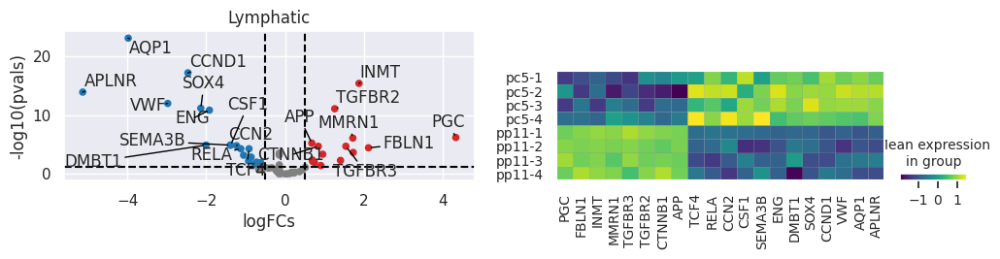

Fitting size factors...
... done in 0.00 seconds.

Fitting dispersions...
... done in 0.10 seconds.

Fitting dispersion trend curve...
... done in 0.05 seconds.

Fitting MAP dispersions...
... done in 0.09 seconds.

Fitting LFCs...
... done in 0.07 seconds.

Refitting 0 outliers.

Running Wald tests...
... done in 0.07 seconds.

Log2 fold change & Wald test p-value: group CTRL vs PAH


,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
ACVR1B,25.189495,0.337130,0.255788,1.318008,1.875009e-01,2.357154e-01
ACVRL1,29.061533,1.342479,0.290191,4.626188,3.724575e-06,8.404170e-06
APLNR,18.890049,3.361563,0.411991,8.159302,3.369671e-16,2.281008e-15
APOE,22.660675,-1.650758,0.555155,-2.973506,2.944189e-03,5.181772e-03
APP,208.019730,-0.266816,0.122709,-2.174370,2.967738e-02,4.502774e-02
...,...,...,...,...,...,...
TP53,21.923134,-0.531001,0.304749,-1.742420,8.143502e-02,1.137505e-01
TXNDC5,22.803589,-0.625432,0.326253,-1.917017,5.523576e-02,7.839914e-02
TYROBP,21.550646,-1.632921,0.299708,-5.448371,5.083311e-08,1.397911e-07
VWF,188.871826,1.589525,0.318666,4.988059,6.098885e-07,1.450546e-06


Fitting MAP LFCs...
... done in 0.07 seconds.

Shrunk Log2 fold change & Wald test p-value: group PAH vs CTRL


,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
ACVR1B,25.189495,-0.317677,0.253302,1.318008,1.875009e-01,2.357154e-01
ACVRL1,29.061533,-1.284579,0.288430,4.626188,3.724575e-06,8.404170e-06
APLNR,18.890049,-3.275881,0.408817,8.159302,3.369671e-16,2.281008e-15
APOE,22.660675,1.433989,0.560346,-2.973506,2.944189e-03,5.181772e-03
APP,208.019730,0.263264,0.122502,-2.174370,2.967738e-02,4.502774e-02
...,...,...,...,...,...,...
TP53,21.923134,0.492432,0.299806,-1.742420,8.143502e-02,1.137505e-01
TXNDC5,22.803589,0.575275,0.322013,-1.917017,5.523576e-02,7.839914e-02
TYROBP,21.550646,1.571514,0.296030,-5.448371,5.083311e-08,1.397911e-07
VWF,188.871826,-1.517982,0.318727,4.988059,6.098885e-07,1.450546e-06


<Figure size 100x600 with 0 Axes>

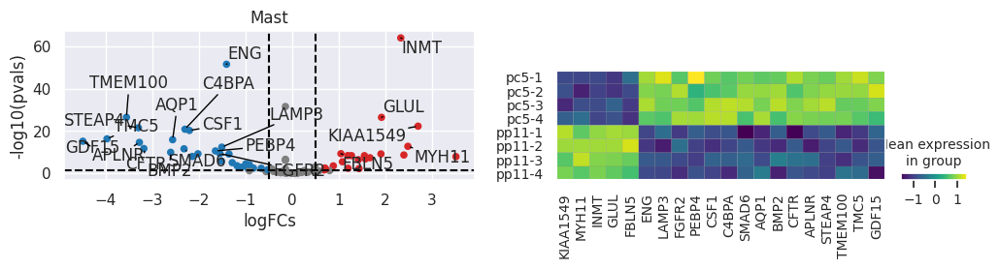

Fitting size factors...
... done in 0.00 seconds.

Fitting dispersions...
... done in 0.06 seconds.

Fitting dispersion trend curve...
... done in 0.04 seconds.

Fitting MAP dispersions...
... done in 0.05 seconds.

Fitting LFCs...
... done in 0.04 seconds.

Refitting 0 outliers.

Running Wald tests...
... done in 0.04 seconds.

Log2 fold change & Wald test p-value: group CTRL vs PAH


,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
ACVRL1,17.097448,-0.013059,0.346170,-0.037724,9.699081e-01,9.699081e-01
ANPEP,32.763878,0.598059,0.200301,2.985801,2.828369e-03,5.342474e-03
APP,109.583939,-0.611039,0.206025,-2.965850,3.018478e-03,5.497942e-03
AQP1,150.728821,2.524967,0.283412,8.909181,5.141069e-19,1.310973e-17
ARFGEF3,18.006710,2.793175,0.501126,5.573794,2.492501e-08,1.155614e-07
BTNL9,23.933819,1.457848,0.393065,3.708922,2.081435e-04,5.307659e-04
C4BPA,46.632401,3.370934,0.550882,6.119155,9.407298e-10,5.997152e-09
CCND1,45.582306,0.457371,0.330638,1.383299,1.665732e-01,2.178265e-01
CGN,20.173525,2.000303,0.390067,5.128098,2.926834e-07,1.066204e-06
CIITA,33.848274,-1.421851,0.357993,-3.971730,7.135258e-05,1.915254e-04


Fitting MAP LFCs...
... done in 0.04 seconds.

Shrunk Log2 fold change & Wald test p-value: group PAH vs CTRL


,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
ACVRL1,17.097448,0.012177,0.336664,-0.037724,9.699081e-01,9.699081e-01
ANPEP,32.763878,-0.578463,0.199975,2.985801,2.828369e-03,5.342474e-03
APP,109.583939,0.590619,0.204980,-2.965850,3.018478e-03,5.497942e-03
AQP1,150.728821,-2.475814,0.284053,8.909181,5.141069e-19,1.310973e-17
ARFGEF3,18.006710,-2.648280,0.500252,5.573794,2.492501e-08,1.155614e-07
BTNL9,23.933819,-1.348946,0.393991,3.708922,2.081435e-04,5.307659e-04
C4BPA,46.632401,-3.212916,0.554170,6.119155,9.407298e-10,5.997152e-09
CCND1,45.582306,-0.416009,0.322955,1.383299,1.665732e-01,2.178265e-01
CGN,20.173525,-1.898168,0.390464,5.128098,2.926834e-07,1.066204e-06
CIITA,33.848274,1.333077,0.358058,-3.971730,7.135258e-05,1.915254e-04


<Figure size 100x600 with 0 Axes>

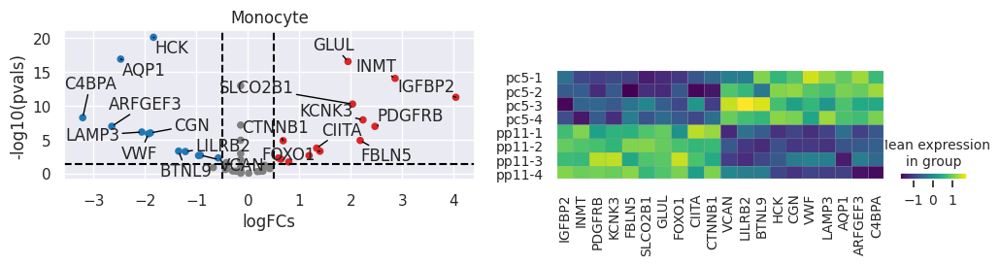

Fitting size factors...
... done in 0.00 seconds.

Fitting dispersions...
... done in 0.08 seconds.

Fitting dispersion trend curve...
... done in 0.03 seconds.

Fitting MAP dispersions...
... done in 0.08 seconds.

Fitting LFCs...
... done in 0.05 seconds.

Refitting 0 outliers.

Running Wald tests...
... done in 0.05 seconds.

Log2 fold change & Wald test p-value: group CTRL vs PAH


,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
ADGRG6,41.077431,0.682891,0.312110,2.187985,2.867069e-02,5.269208e-02
APP,258.755157,-0.195105,0.110684,-1.762711,7.794916e-02,1.232684e-01
AQP1,149.815262,1.398728,0.260109,5.377469,7.554021e-08,3.669096e-07
BMP1,36.362282,0.081482,0.225427,0.361455,7.177594e-01,7.872199e-01
BTNL9,24.451916,0.481181,0.218457,2.202636,2.762040e-02,5.217187e-02
...,...,...,...,...,...,...
TP53,18.783388,-0.353304,0.312891,-1.129160,2.588302e-01,3.433623e-01
VCAN,48.588150,-0.334770,0.248114,-1.349257,1.772543e-01,2.564530e-01
VWF,79.583344,-0.307953,0.363821,-0.846441,3.973067e-01,4.739800e-01
WNT5A,65.486717,0.293459,0.129728,2.262113,2.369041e-02,4.738083e-02


Fitting MAP LFCs...
... done in 0.06 seconds.

Shrunk Log2 fold change & Wald test p-value: group PAH vs CTRL


,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
ADGRG6,41.077431,-0.590360,0.307459,2.187985,2.867069e-02,5.269208e-02
APP,258.755157,0.191391,0.110291,-1.762711,7.794916e-02,1.232684e-01
AQP1,149.815262,-1.330885,0.261240,5.377469,7.554021e-08,3.669096e-07
BMP1,36.362282,-0.073032,0.220947,0.361455,7.177594e-01,7.872199e-01
BTNL9,24.451916,-0.437198,0.217503,2.202636,2.762040e-02,5.217187e-02
...,...,...,...,...,...,...
TP53,18.783388,0.295464,0.304018,-1.129160,2.588302e-01,3.433623e-01
VCAN,48.588150,0.298061,0.243758,-1.349257,1.772543e-01,2.564530e-01
VWF,79.583344,0.242377,0.345194,-0.846441,3.973067e-01,4.739800e-01
WNT5A,65.486717,-0.144270,0.814770,2.262113,2.369041e-02,4.738083e-02


<Figure size 100x600 with 0 Axes>

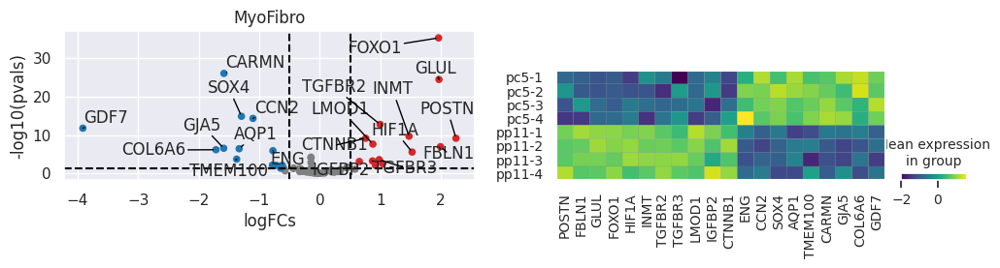

Fitting size factors...
... done in 0.00 seconds.

Fitting dispersions...
... done in 0.06 seconds.

Fitting dispersion trend curve...
... done in 0.03 seconds.

Fitting MAP dispersions...
... done in 0.04 seconds.

Fitting LFCs...
... done in 0.03 seconds.

Refitting 0 outliers.

Running Wald tests...
... done in 0.03 seconds.

Log2 fold change & Wald test p-value: group CTRL vs PAH


,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
APP,126.180283,0.066136,0.179067,0.369335,7.118779e-01,7.503578e-01
AQP1,86.594437,1.491064,0.281346,5.299756,1.159576e-07,3.230248e-07
C4BPA,22.761572,-1.999035,0.272184,-7.344414,2.066626e-13,2.686614e-12
CCL5,67.174988,1.959311,0.286215,6.845579,7.616694e-12,4.243587e-11
CCND1,59.105705,-0.303322,0.293782,-1.032474,3.018503e-01,3.678800e-01
CRIM1,26.887960,-0.906492,0.202002,-4.487532,7.205300e-06,1.652980e-05
CTNNB1,64.585701,-0.563515,0.219913,-2.562450,1.039366e-02,1.842512e-02
DMBT1,21.712034,2.095541,0.441317,4.748384,2.050479e-06,5.331246e-06
ENG,71.858612,0.407413,0.310642,1.311519,1.896824e-01,2.487432e-01
ERBB2,20.866081,0.828325,0.322183,2.570982,1.014106e-02,1.842512e-02


Fitting MAP LFCs...
... done in 0.03 seconds.

Shrunk Log2 fold change & Wald test p-value: group PAH vs CTRL


,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
APP,126.180283,-0.063968,0.177604,0.369335,7.118779e-01,7.503578e-01
AQP1,86.594437,-1.436179,0.279085,5.299756,1.159576e-07,3.230248e-07
C4BPA,22.761572,-0.144270,0.814844,-7.344414,2.066626e-13,2.686614e-12
CCL5,67.174988,-1.903249,0.289032,6.845579,7.616694e-12,4.243587e-11
CCND1,59.105705,0.280829,0.290507,-1.032474,3.018503e-01,3.678800e-01
CRIM1,26.887960,-0.144270,0.814844,-4.487532,7.205300e-06,1.652980e-05
CTNNB1,64.585701,0.541995,0.217503,-2.562450,1.039366e-02,1.842512e-02
DMBT1,21.712034,-1.969076,0.437894,4.748384,2.050479e-06,5.331246e-06
ENG,71.858612,-0.374524,0.303097,1.311519,1.896824e-01,2.487432e-01
ERBB2,20.866081,-0.768123,0.318550,2.570982,1.014106e-02,1.842512e-02


<Figure size 100x600 with 0 Axes>

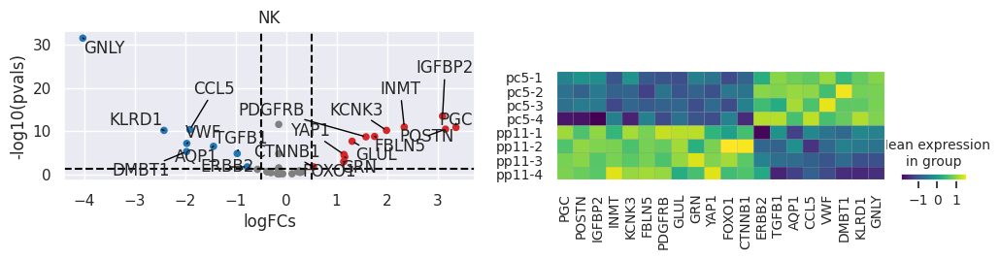

Fitting size factors...
... done in 0.00 seconds.

Fitting dispersions...
... done in 0.21 seconds.

Fitting dispersion trend curve...
... done in 0.06 seconds.

Fitting MAP dispersions...
... done in 0.19 seconds.

Fitting LFCs...
... done in 0.13 seconds.

Refitting 0 outliers.

Running Wald tests...
... done in 0.14 seconds.

Log2 fold change & Wald test p-value: group CTRL vs PAH


,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
ACE2,13.591188,-4.880968,1.318957,-3.700626,0.000215,0.000594
ACP5,23.268282,-0.391352,0.283941,-1.378285,0.168115,0.235904
ACVR1,51.589672,-0.100912,0.215904,-0.467391,0.640220,0.714092
ACVR1B,46.011490,0.442095,0.233636,1.892236,0.058460,0.093321
ACVRL1,124.145866,-0.068818,0.231515,-0.297252,0.766274,0.817986
...,...,...,...,...,...,...
VWF,727.625977,-0.056013,0.157315,-0.356054,0.721800,0.780082
WNT3A,63.290558,0.601885,0.221581,2.716321,0.006601,0.013356
WNT5A,77.579369,-0.840540,0.228649,-3.676121,0.000237,0.000641
YAP1,281.097992,-0.149227,0.130013,-1.147785,0.251057,0.321206


Fitting MAP LFCs...
... done in 0.13 seconds.

Shrunk Log2 fold change & Wald test p-value: group PAH vs CTRL


,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
ACE2,13.591188,4.485019,1.167677,-3.700626,0.000215,0.000594
ACP5,23.268282,-0.144270,1.069664,-1.378285,0.168115,0.235904
ACVR1,51.589672,0.092318,0.213952,-0.467391,0.640220,0.714092
ACVR1B,46.011490,-0.401743,0.233005,1.892236,0.058460,0.093321
ACVRL1,124.145866,0.062165,0.226376,-0.297252,0.766274,0.817986
...,...,...,...,...,...,...
VWF,727.625977,0.053413,0.155439,-0.356054,0.721800,0.780082
WNT3A,63.290558,-0.557809,0.220923,2.716321,0.006601,0.013356
WNT5A,77.579369,0.788963,0.226994,-3.676121,0.000237,0.000641
YAP1,281.097992,0.143609,0.129581,-1.147785,0.251057,0.321206


<Figure size 100x600 with 0 Axes>

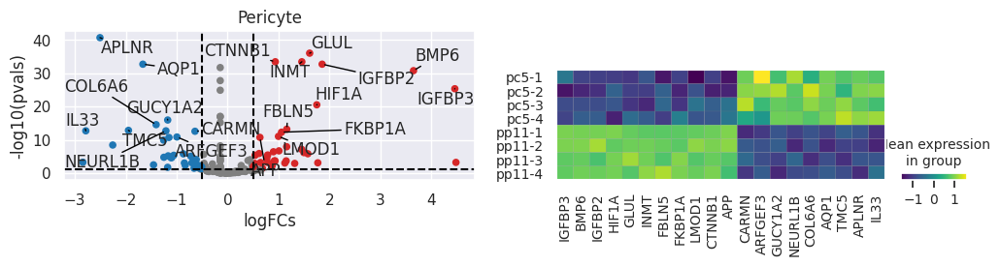

Fitting size factors...
... done in 0.00 seconds.

Fitting dispersions...
... done in 0.12 seconds.

Fitting dispersion trend curve...
... done in 0.05 seconds.

Fitting MAP dispersions...
... done in 0.11 seconds.

Fitting LFCs...
... done in 0.08 seconds.

Refitting 0 outliers.

Running Wald tests...
... done in 0.07 seconds.

Log2 fold change & Wald test p-value: group CTRL vs PAH


,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
ACVR1B,32.002987,1.444905,0.265402,5.444213,5.203494e-08,1.051539e-07
ACVRL1,20.554049,0.110833,0.233175,0.475321,6.345579e-01,6.548097e-01
APP,266.190186,-0.890579,0.147122,-6.053353,1.418612e-09,3.356227e-09
AQP1,330.129639,3.416234,0.233306,14.642742,1.498991e-48,4.846737e-47
ARFGEF3,99.566360,2.531992,0.176405,14.353326,1.015486e-46,2.462554e-45
...,...,...,...,...,...,...
TP53,25.039345,-0.533023,0.197121,-2.704039,6.850230e-03,9.630033e-03
TXNDC5,609.119324,-3.553664,0.481259,-7.384103,1.534843e-13,5.317134e-13
VCAN,22.709455,-3.375197,0.339465,-9.942684,2.714125e-23,2.025155e-22
VWF,84.036919,1.035698,0.372784,2.778278,5.464786e-03,7.795357e-03


Fitting MAP LFCs...
... done in 0.08 seconds.

Shrunk Log2 fold change & Wald test p-value: group PAH vs CTRL


,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
ACVR1B,32.002987,-1.396347,0.263023,5.444213,5.203494e-08,1.051539e-07
ACVRL1,20.554049,-0.144270,0.771976,0.475321,6.345579e-01,6.548097e-01
APP,266.190186,0.877367,0.147259,-6.053353,1.418612e-09,3.356227e-09
AQP1,330.129639,-3.388079,0.231769,14.642742,1.498991e-48,4.846737e-47
ARFGEF3,99.566360,-2.509113,0.175665,14.353326,1.015486e-46,2.462554e-45
...,...,...,...,...,...,...
TP53,25.039345,-0.144270,0.771976,-2.704039,6.850230e-03,9.630033e-03
TXNDC5,609.119324,3.436920,0.485646,-7.384103,1.534843e-13,5.317134e-13
VCAN,22.709455,3.318478,0.335536,-9.942684,2.714125e-23,2.025155e-22
VWF,84.036919,-0.947889,0.365937,2.778278,5.464786e-03,7.795357e-03


<Figure size 100x600 with 0 Axes>

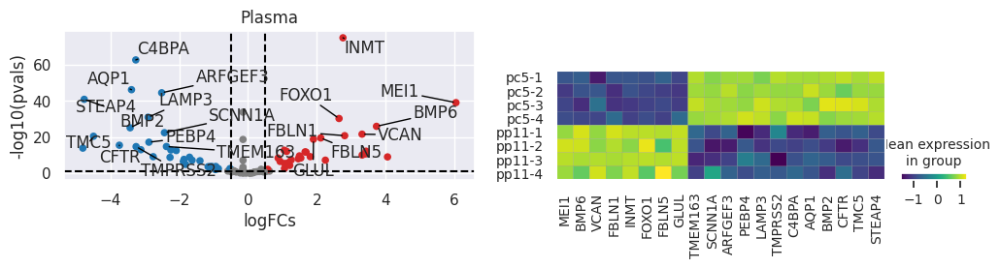

Fitting size factors...
... done in 0.00 seconds.

Fitting dispersions...
... done in 0.07 seconds.

Fitting dispersion trend curve...
... done in 0.06 seconds.

Fitting MAP dispersions...
... done in 0.07 seconds.

Fitting LFCs...
... done in 0.05 seconds.

Refitting 0 outliers.

Running Wald tests...
... done in 0.05 seconds.

Log2 fold change & Wald test p-value: group CTRL vs PAH


,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
ANO1,31.953138,0.530797,0.495187,1.071911,2.837601e-01,3.959444e-01
APP,181.428802,0.178924,0.138428,1.292543,1.961690e-01,3.004217e-01
AQP1,136.459442,1.033179,0.260320,3.968885,7.220968e-05,3.332754e-04
BMP1,24.386473,-0.202052,0.282973,-0.714035,4.752055e-01,5.705999e-01
CARMN,182.504089,0.646969,0.260681,2.481845,1.307040e-02,3.136895e-02
CCDC80,29.947863,1.618469,0.489013,3.309666,9.340732e-04,2.949705e-03
CCN2,135.470627,0.389220,0.446936,0.870862,3.838293e-01,4.797866e-01
CCND1,24.226622,0.748430,0.227834,3.284972,1.019926e-03,3.059777e-03
CDH13,31.502268,0.270959,0.241484,1.122058,2.618379e-01,3.740541e-01
CPE,71.005501,-0.006178,0.439839,-0.014046,9.887934e-01,9.887934e-01


Fitting MAP LFCs...
... done in 0.05 seconds.

Shrunk Log2 fold change & Wald test p-value: group PAH vs CTRL


,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
ANO1,31.953138,-0.371047,0.465239,1.071911,2.837601e-01,3.959444e-01
APP,181.428802,-0.172696,0.137912,1.292543,1.961690e-01,3.004217e-01
AQP1,136.459442,-0.966382,0.262432,3.968885,7.220968e-05,3.332754e-04
BMP1,24.386473,0.175607,0.279391,-0.714035,4.752055e-01,5.705999e-01
CARMN,182.504089,-0.589695,0.256558,2.481845,1.307040e-02,3.136895e-02
CCDC80,29.947863,-1.391058,0.496485,3.309666,9.340732e-04,2.949705e-03
CCN2,135.470627,-0.282410,0.419211,0.870862,3.838293e-01,4.797866e-01
CCND1,24.226622,-0.144270,1.051114,3.284972,1.019926e-03,3.059777e-03
CDH13,31.502268,-0.243872,0.239805,1.122058,2.618379e-01,3.740541e-01
CPE,71.005501,0.005498,0.402842,-0.014046,9.887934e-01,9.887934e-01


<Figure size 100x600 with 0 Axes>

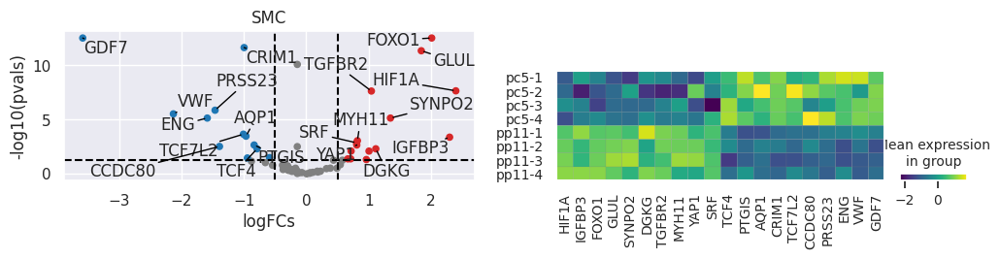

Fitting size factors...
... done in 0.00 seconds.

Fitting dispersions...
... done in 0.15 seconds.

Fitting dispersion trend curve...
... done in 0.06 seconds.

Fitting MAP dispersions...
... done in 0.16 seconds.

Fitting LFCs...
... done in 0.11 seconds.

Refitting 0 outliers.

Running Wald tests...
... done in 0.12 seconds.

Log2 fold change & Wald test p-value: group CTRL vs PAH


,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
ACOXL,22.764072,-0.477528,0.455996,-1.047220,0.294998,0.353998
ACP5,22.682449,-0.545587,0.428130,-1.274347,0.202540,0.267576
ACVR1,29.465580,0.304561,0.269620,1.129593,0.258648,0.321066
ACVR1B,36.087299,2.175345,0.502241,4.331276,0.000015,0.000045
ACVRL1,29.668171,-0.192751,0.332880,-0.579040,0.562562,0.613704
...,...,...,...,...,...,...
TXNDC5,51.699791,-1.247740,0.279517,-4.463909,0.000008,0.000028
VWF,244.145477,-0.327758,0.186571,-1.756742,0.078962,0.113705
WNT3A,16.751688,-0.505878,0.462215,-1.094466,0.273751,0.334069
WNT5A,31.619268,1.604992,0.356581,4.501060,0.000007,0.000025


Fitting MAP LFCs...
... done in 0.12 seconds.

Shrunk Log2 fold change & Wald test p-value: group PAH vs CTRL


,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
ACOXL,22.764072,0.405241,0.442715,-1.047220,0.294998,0.353998
ACP5,22.682449,0.472440,0.417975,-1.274347,0.202540,0.267576
ACVR1,29.465580,-0.144270,1.337729,1.129593,0.258648,0.321066
ACVR1B,36.087299,-2.008077,0.503748,4.331276,0.000015,0.000045
ACVRL1,29.668171,0.175388,0.328802,-0.579040,0.562562,0.613704
...,...,...,...,...,...,...
TXNDC5,51.699791,1.176881,0.273265,-4.463909,0.000008,0.000028
VWF,244.145477,0.318037,0.185626,-1.756742,0.078962,0.113705
WNT3A,16.751688,0.425870,0.451421,-1.094466,0.273751,0.334069
WNT5A,31.619268,-1.516472,0.356085,4.501060,0.000007,0.000025


<Figure size 100x600 with 0 Axes>

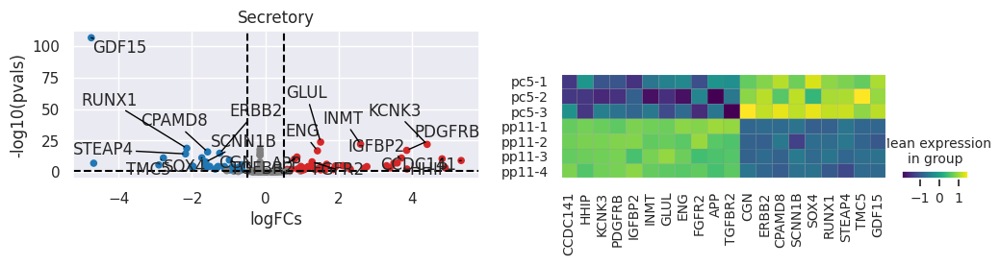

Fitting size factors...
... done in 0.00 seconds.

Fitting dispersions...
... done in 0.12 seconds.

Fitting dispersion trend curve...
... done in 0.06 seconds.

Fitting MAP dispersions...
... done in 0.11 seconds.

Fitting LFCs...
... done in 0.08 seconds.

Refitting 0 outliers.

Running Wald tests...
... done in 0.09 seconds.

Log2 fold change & Wald test p-value: group CTRL vs PAH


,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
ACVR1,24.904705,-0.926054,0.257429,-3.597320,3.215126e-04,7.251134e-04
ACVR1B,27.518362,1.310804,0.276190,4.746029,2.074491e-06,6.663515e-06
ACVRL1,100.926224,0.327269,0.251913,1.299134,1.938980e-01,2.258592e-01
ADGRG6,104.038757,2.167167,0.278756,7.774419,7.579461e-15,8.926921e-14
APLNR,52.754246,1.548886,0.338750,4.572353,4.822782e-06,1.460614e-05
...,...,...,...,...,...,...
TP53,37.143597,-0.609833,0.209173,-2.915446,3.551806e-03,6.605114e-03
TXNDC5,47.750217,-0.998506,0.226917,-4.400321,1.080909e-05,3.015168e-05
VCAM1,50.219395,0.800514,0.451015,1.774915,7.591193e-02,1.018565e-01
VWF,2530.524170,0.194009,0.127508,1.521544,1.281233e-01,1.616795e-01


Fitting MAP LFCs...
... done in 0.09 seconds.

Shrunk Log2 fold change & Wald test p-value: group PAH vs CTRL


,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
ACVR1,24.904705,-0.144270,0.958112,-3.597320,3.215126e-04,7.251134e-04
ACVR1B,27.518362,-1.254120,0.275476,4.746029,2.074491e-06,6.663515e-06
ACVRL1,100.926224,-0.306500,0.248327,1.299134,1.938980e-01,2.258592e-01
ADGRG6,104.038757,-2.113925,0.280431,7.774419,7.579461e-15,8.926921e-14
APLNR,52.754246,-1.463251,0.339059,4.572353,4.822782e-06,1.460614e-05
...,...,...,...,...,...,...
TP53,37.143597,0.588325,0.207699,-2.915446,3.551806e-03,6.605114e-03
TXNDC5,47.750217,0.962613,0.225001,-4.400321,1.080909e-05,3.015168e-05
VCAM1,50.219395,-0.678540,0.438309,1.774915,7.591193e-02,1.018565e-01
VWF,2530.524170,-0.188435,0.126839,1.521544,1.281233e-01,1.616795e-01


<Figure size 100x600 with 0 Axes>

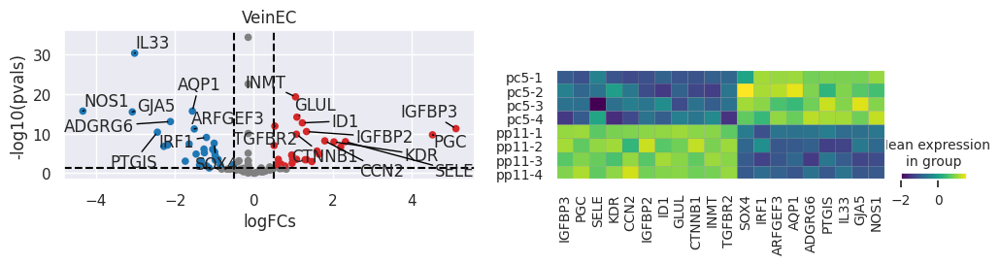

Fitting size factors...
... done in 0.00 seconds.

Fitting dispersions...
... done in 0.14 seconds.

Fitting dispersion trend curve...
... done in 0.06 seconds.

Fitting MAP dispersions...
... done in 0.13 seconds.

Fitting LFCs...
... done in 0.09 seconds.

Refitting 0 outliers.

Running Wald tests...
... done in 0.10 seconds.

Log2 fold change & Wald test p-value: group CTRL vs PAH


,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
ACVR1B,32.694778,1.160845,0.201666,5.756269,8.599339e-09,4.068149e-08
ACVRL1,266.547882,-0.351059,0.106084,-3.309247,9.354718e-04,1.855855e-03
ADGRG6,28.165764,0.144920,0.433220,0.334517,7.379895e-01,7.664068e-01
APLN,129.748489,0.211995,0.372201,0.569572,5.689683e-01,6.233116e-01
APLNR,64.757591,0.771928,0.213716,3.611940,3.039144e-04,6.675262e-04
...,...,...,...,...,...,...
VCAN,34.139931,-1.589391,0.406759,-3.907452,9.327465e-05,2.294556e-04
VWF,369.616211,-0.321969,0.146908,-2.191639,2.840556e-02,4.313437e-02
WNT3A,29.953451,1.215768,0.271807,4.472908,7.716309e-06,2.221194e-05
YAP1,141.521973,-0.290633,0.098359,-2.954830,3.128414e-03,5.497070e-03


Fitting MAP LFCs...
... done in 0.10 seconds.

Shrunk Log2 fold change & Wald test p-value: group PAH vs CTRL


,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
ACVR1B,32.694778,-1.124739,0.202096,5.756269,8.599339e-09,4.068149e-08
ACVRL1,266.547882,0.345669,0.105815,-3.309247,9.354718e-04,1.855855e-03
ADGRG6,28.165764,-0.111446,0.408576,0.334517,7.379895e-01,7.664068e-01
APLN,129.748489,-0.174861,0.355242,0.569572,5.689683e-01,6.233116e-01
APLNR,64.757591,-0.735260,0.212446,3.611940,3.039144e-04,6.675262e-04
...,...,...,...,...,...,...
VCAN,34.139931,1.451096,0.405129,-3.907452,9.327465e-05,2.294556e-04
VWF,369.616211,0.310208,0.145798,-2.191639,2.840556e-02,4.313437e-02
WNT3A,29.953451,-1.150581,0.271503,4.472908,7.716309e-06,2.221194e-05
YAP1,141.521973,0.286385,0.098242,-2.954830,3.128414e-03,5.497070e-03


<Figure size 100x600 with 0 Axes>

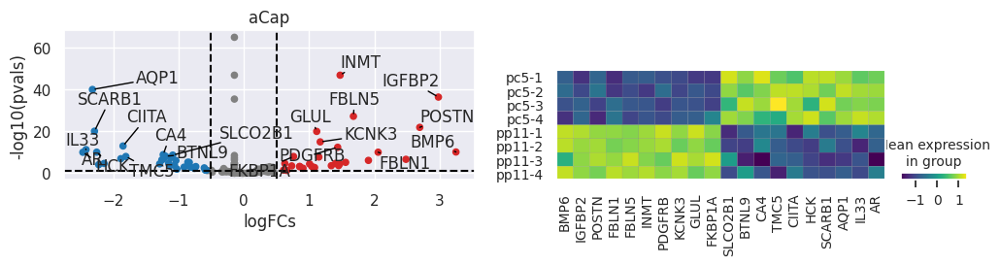

Fitting size factors...
... done in 0.00 seconds.

Fitting dispersions...
... done in 0.19 seconds.

Fitting dispersion trend curve...
... done in 0.08 seconds.

Fitting MAP dispersions...
... done in 0.18 seconds.

Fitting LFCs...
... done in 0.08 seconds.

Refitting 0 outliers.

Running Wald tests...
... done in 0.09 seconds.

Log2 fold change & Wald test p-value: group CTRL vs PAH


,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
ACP5,40.475544,-0.665447,0.273448,-2.433542,1.495190e-02,2.066880e-02
ACVR1,66.849068,-0.528840,0.218043,-2.425387,1.529206e-02,2.098472e-02
ACVR1B,84.915207,0.977056,0.159939,6.108922,1.003065e-09,3.091413e-09
ACVR2B,23.371614,0.283325,0.278126,1.018694,3.083483e-01,3.471226e-01
ACVRL1,579.401611,1.083423,0.139336,7.775621,7.507822e-15,3.003129e-14
...,...,...,...,...,...,...
VWF,3900.243408,0.499258,0.093242,5.354456,8.581414e-08,2.151074e-07
WNT3A,62.603668,0.630949,0.134547,4.689428,2.739694e-06,6.059558e-06
WNT5A,27.881857,-0.052790,0.287729,-0.183471,8.544282e-01,8.825962e-01
YAP1,440.402985,-0.264745,0.055735,-4.750040,2.033762e-06,4.551752e-06


Fitting MAP LFCs...
... done in 0.08 seconds.

Shrunk Log2 fold change & Wald test p-value: group PAH vs CTRL


,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
ACP5,40.475544,0.624557,0.271769,-2.433542,1.495190e-02,2.066880e-02
ACVR1,66.849068,0.505874,0.216965,-2.425387,1.529206e-02,2.098472e-02
ACVR1B,84.915207,-0.958791,0.159991,6.108922,1.003065e-09,3.091413e-09
ACVR2B,23.371614,-0.261708,0.273996,1.018694,3.083483e-01,3.471226e-01
ACVRL1,579.401611,-1.067568,0.139467,7.775621,7.507822e-15,3.003129e-14
...,...,...,...,...,...,...
VWF,3900.243408,-0.495439,0.093098,5.354456,8.581414e-08,2.151074e-07
WNT3A,62.603668,-0.144270,0.976209,4.689428,2.739694e-06,6.059558e-06
WNT5A,27.881857,0.049232,0.283377,-0.183471,8.544282e-01,8.825962e-01
YAP1,440.402985,-0.144270,0.976208,-4.750040,2.033762e-06,4.551752e-06


<Figure size 100x600 with 0 Axes>

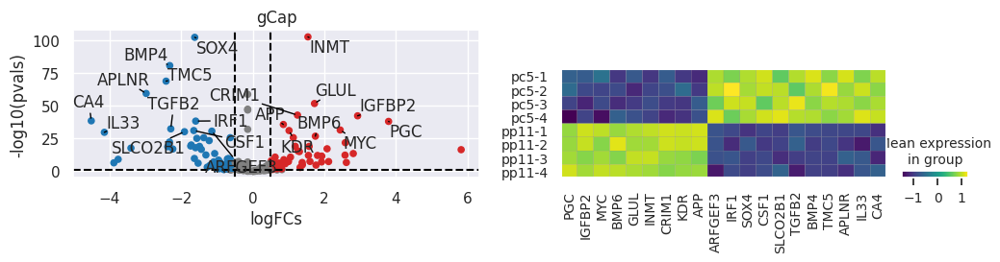

<Figure size 100x600 with 0 Axes>

In [12]:
celltypes = concat.obs['celltype'].cat.categories.tolist()
full_df = pd.DataFrame()
#celltypes = ['aCap','gCap']
for ct in celltypes:
    sub = pdata[pdata.obs['celltype'] == ct].copy()

    if(len(sub.obs.group.to_list()) > 1):

        #dc.plot_filter_by_expr(sub, group='group', min_count=10, min_total_count=15)

        # Obtain genes that pass the thresholds
        genes = dc.filter_by_expr(sub, group='group', min_count=20, min_total_count=20)
        # Filter by these genes
        sub = sub[:, genes].copy()

        if(len(sub.obs.group.unique().tolist()) > 1):

            # Build DESeq2 object
            dds = DeseqDataSet(
                adata=sub,
                design_factors='group',
                ref_level=['group', 'CTRL'],
                refit_cooks=True,
                n_cpus=8,
            )
            dds.deseq2()
            stat_res = DeseqStats(dds, contrast=["group", 'CTRL', 'PAH'], n_cpus=8)

            stat_res.summary()
            stat_res.lfc_shrink(coeff='group_PAH_vs_CTRL')

            results_df = stat_res.results_df
            #results_df

            fig, axs = plt.subplots(1, 2, figsize=(12,2))
            dc.plot_volcano_df(results_df, x='log2FoldChange', y='padj', ax=axs[0], top=20)
            axs[0].set_title(ct)
            
            # sign_thr=0.05, lFCs_thr=0.5
            results_df['pvals'] = -np.log10(results_df['padj'])
            results_df.to_csv("decoupler/parechyme_P11-C5_" + ct + ".csv")

            up_msk = (results_df['log2FoldChange'] >= 0.5) & (results_df['pvals'] >= -np.log10(0.05))
            dw_msk = (results_df['log2FoldChange'] <= -0.5) & (results_df['pvals'] >= -np.log10(0.05))
            signs = results_df[up_msk | dw_msk].sort_values('pvals', ascending=False)
            signs = signs.iloc[:20]
            #print("LOOK HERE\n\n" , signs)

            results_df['sig'] = 0
            results_df['celltype'] = ct
            results_df.loc[signs.index,'sig'] = 1

            full_df = pd.concat([full_df, results_df])

            signs = signs.sort_values('log2FoldChange', ascending=False)

            if(len(signs.index.tolist()) > 0):
                sc.pp.normalize_total(sub)
                sc.pp.log1p(sub)
                sc.pp.scale(sub, max_value=10)
                sc.pl.matrixplot(sub,signs.index, groupby='zone', ax=axs[1])

            plt.tight_layout()
            fig.savefig("decoupler/parechyme_P11-C5_" + ct + ".pdf", bbox_inches='tight')


In [41]:
full_df

,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj,pvals,sig,celltype
ACVR1B,32.694778,-1.124739,0.202096,5.756269,8.599339e-09,4.068149e-08,7.390603,0,aCap
ACVRL1,266.547882,0.345669,0.105815,-3.309247,9.354718e-04,1.855855e-03,2.731456,0,aCap
ADGRG6,28.165764,-0.111446,0.408576,0.334517,7.379895e-01,7.664068e-01,0.115541,0,aCap
APLN,129.748489,-0.174861,0.355242,0.569572,5.689683e-01,6.233116e-01,0.205295,0,aCap
APLNR,64.757591,-0.735260,0.212446,3.611940,3.039144e-04,6.675262e-04,3.175532,0,aCap
...,...,...,...,...,...,...,...,...,...
VWF,3900.243408,-0.495439,0.093098,5.354456,8.581414e-08,2.151074e-07,6.667345,0,gCap
WNT3A,62.603668,-0.144270,0.976209,4.689428,2.739694e-06,6.059558e-06,5.217559,0,gCap
WNT5A,27.881857,0.049232,0.283377,-0.183471,8.544282e-01,8.825962e-01,0.054238,0,gCap
YAP1,440.402985,-0.144270,0.976208,-4.750040,2.033762e-06,4.551752e-06,5.341821,0,gCap


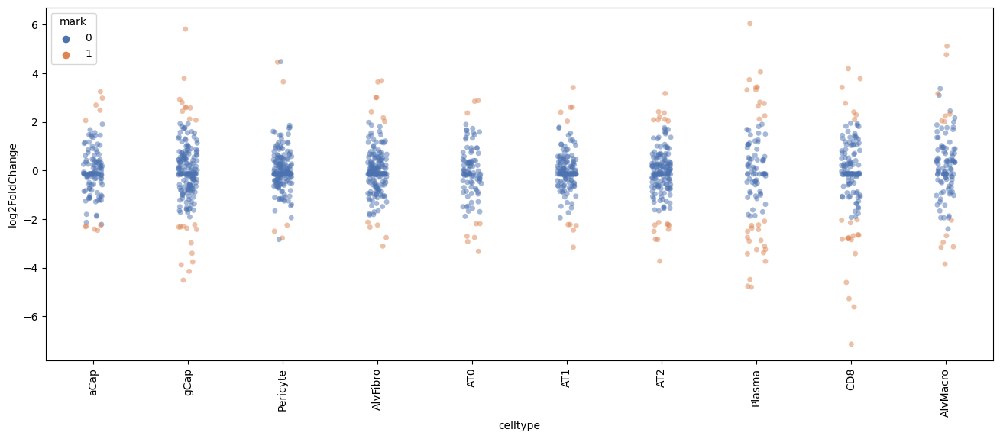

In [25]:
lst = ["ArtEC", "VeinEC", "aCap",'gCap','Pericyte','MyoFibro','AdvFibro','AlvFibro','SMC',
       'Lymphatic','AT0','AT1','AT2','Basal','Multiciliated','Secretory','Plasma','B','NK',
       'CD4','CD8','Dendritic','Monocyte','Mast','Megak','AlvMacro','InterMacro']
keep = ['aCap','gCap','Pericyte','AlvFibro','AT0','AT1','AT2','Plasma','CD8','AlvMacro']

full_df['mark'] = 0
full_df.loc[full_df.padj < 1e-5, 'mark'] = 1
full_df.loc[abs(full_df.log2FoldChange) < 2, 'mark'] = 0

plot_df = full_df[full_df.celltype.isin(keep)]

plt.style.use('default')
plt.rcParams['figure.figsize'] = [16,6]
sns.stripplot(data=plot_df, x="celltype", y="log2FoldChange", hue="mark", 
              orient='v', palette="deep", size=5, alpha = 0.5, 
              order = keep)
plt.xticks(rotation=90)

plt.savefig('stripplot.pdf')

In [26]:
plot_df.to_csv('plot_df.csv')

# Zoom in parenchyma

In [3]:
adc5 = sc.read_h5ad("./outs/adC5.htap.h5ad")
print('adc5 ',adc5.shape)
adp11 = sc.read_h5ad("./outs/adP11.htap.h5ad")
print('adp11 ',adp11.shape)

adc5  (154142, 293)
adp11  (298993, 293)


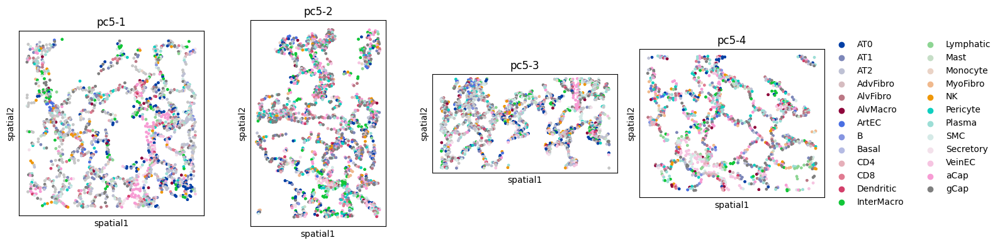

In [4]:
df = pd.DataFrame({'zone': ['pc5-1', 'pc5-2','pc5-3', 'pc5-4'],
        'x': [1500, 0, 4000, 7000],
        'y': [7500, 4500, 5500, 3000],
        'size_x': [1000, 1000, 1500, 1000],
        'size_y': [1000, 1500, 800, 800]})
pC5 = scis.pl.get_regions(adc5,df)

In [5]:
pC5.obs.zone.value_counts()

zone
pc5-2    1843
pc5-3    1736
pc5-1    1731
pc5-4    1153
Name: count, dtype: int64

248 cells to plot
saving C5[x=7300,y=3000].pdf


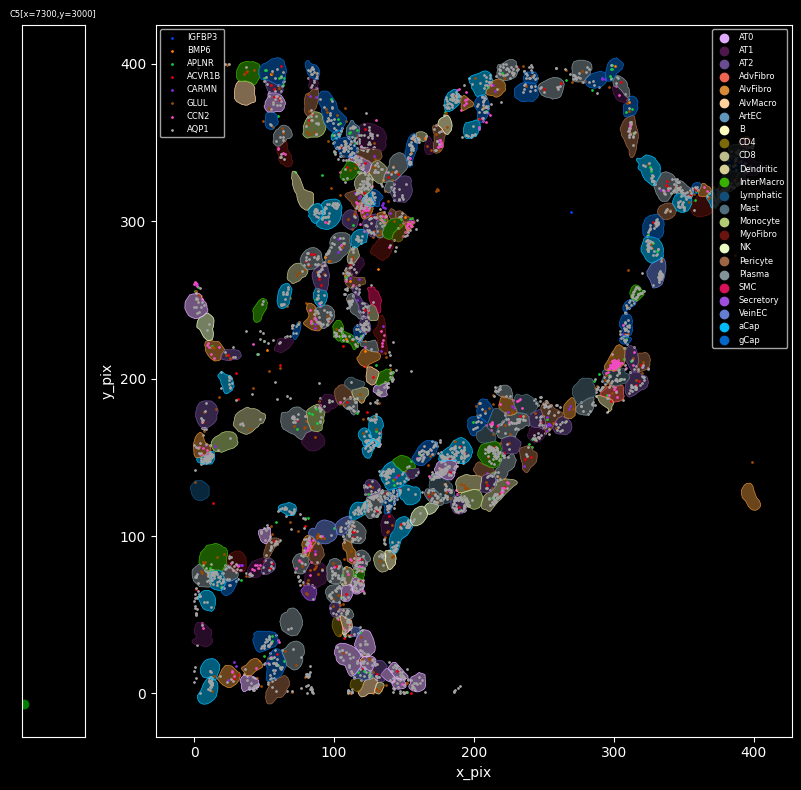

In [23]:
keep = ['aCap','gCap','Pericyte','AlvFibro','InterMacro','AT0','AT1','AT2','Plasma','CD8','AlvMacro']

adtmp = scis.pl.view_region(adc5, "celltype", ['IGFBP3','BMP6','APLNR','ACVR1B','CARMN','GLUL','CCN2','AQP1'], pt_size=1, fill_polygons=True,
                       x=7300, y=3000, size_x=400, size_y=400, noimage=True, lw=0.5,
                       #metafilt='celltype', metafiltvals=keep,
                       save=True, figsize=(8,8), mypal=scis.io.get_palette(color_key='celltype'))

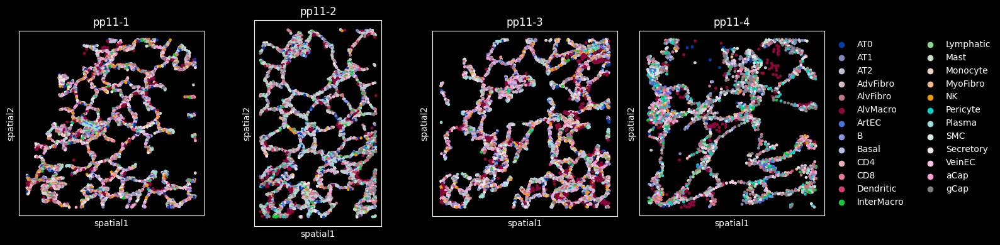

In [18]:
df = pd.DataFrame({'zone': ['pp11-1', 'pp11-2', 'pp11-3', 'pp11-4'],
        'x': [500, 1800, 3000, 7000],
        'y': [2800, 2800, 1000, 4000],
        'size_x': [1300, 800, 1300, 800],
        'size_y': [1300, 1300, 1300, 800]})
pP11 = scis.pl.get_regions(adp11,df)

417 cells to plot
saving P11[x=900,y=2900].pdf


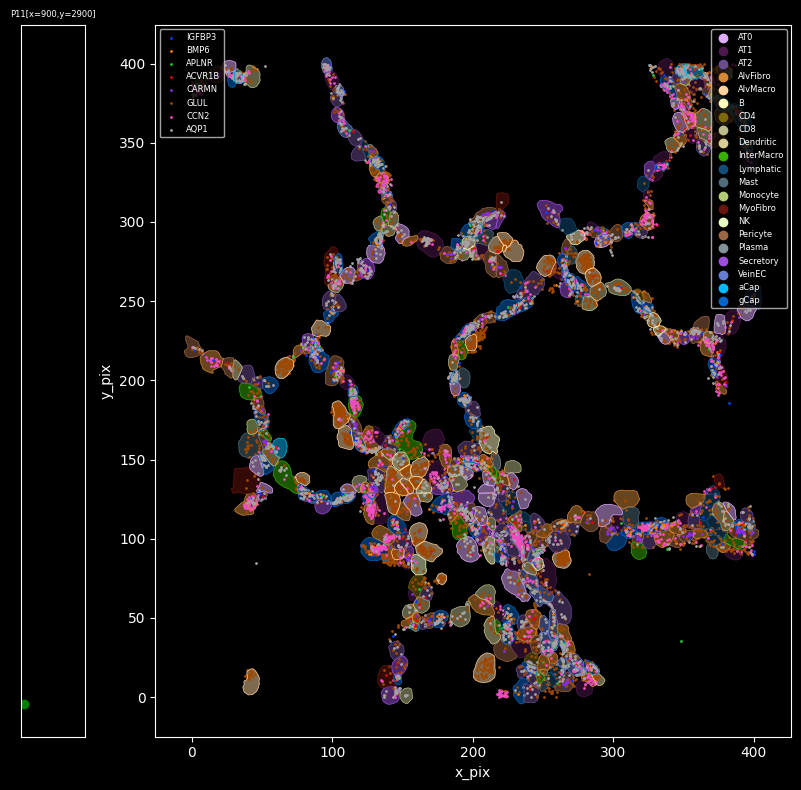

In [22]:
keep = ['aCap','gCap','Pericyte','AlvFibro','InterMacro','AT0','AT1','AT2','Plasma','CD8','B','AlvMacro']

adtmp = scis.pl.view_region(adp11, "celltype", ['IGFBP3','BMP6','APLNR','ACVR1B','CARMN','GLUL','CCN2','AQP1'], pt_size=1, fill_polygons=True,
                       x=900, y=2900, size_x=400, size_y=400, noimage=True, lw=0.5,
                       #metafilt='celltype', metafiltvals=keep,
                       save=True, figsize=(8,8), mypal=scis.io.get_palette(color_key='celltype'))

In [21]:
adtmp.obs.celltype.value_counts()

celltype
gCap          58
AlvFibro      47
Pericyte      41
AT2           40
AT1           30
CD8           30
AlvMacro      28
AT0           26
InterMacro    15
B             10
aCap           8
Plasma         3
Name: count, dtype: int64

In [31]:
keep = ['aCap','gCap','Pericyte','AlvFibro','InterMacro','AT0','AT1','AT2','Plasma','CD8','B']
subpC5 = pC5[pC5.obs.celltype.isin(keep)]
subpP11 = pP11[pP11.obs.celltype.isin(keep)]

In [32]:

sq.gr.spatial_neighbors(subpC5, coord_type="generic")
sq.gr.nhood_enrichment(subpC5, cluster_key="celltype")

sq.gr.spatial_neighbors(subpP11, coord_type="generic")
sq.gr.nhood_enrichment(subpP11, cluster_key="celltype")

  0%|          | 0/1000 [00:00<?, ?/s]

  0%|          | 0/1000 [00:00<?, ?/s]

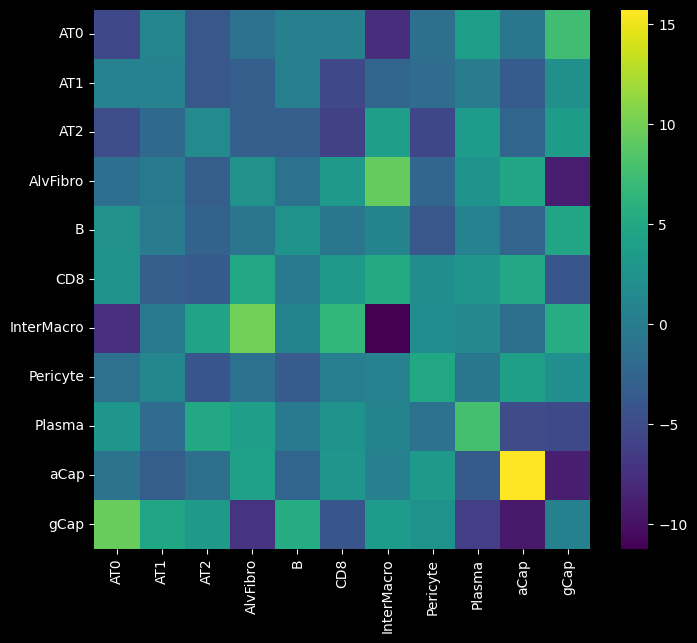

In [33]:
dif = subpP11.uns['celltype_nhood_enrichment']['zscore'] - subpC5.uns['celltype_nhood_enrichment']['zscore']
dif = pd.DataFrame(dif)
dif.columns = subpP11.obs.celltype.cat.categories
dif.index = subpC5.obs.celltype.cat.categories
plt.figure(figsize = (8,7))
ax = sns.heatmap(dif, cmap='viridis')

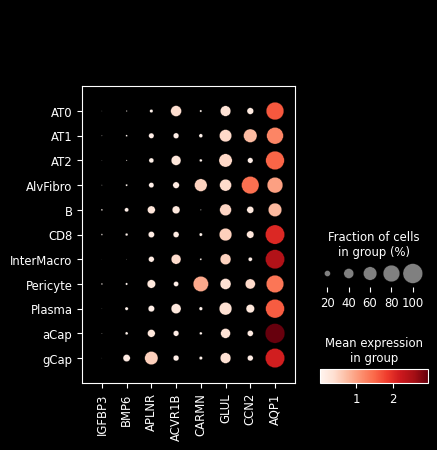

In [40]:

sc.pl.dotplot(subpC5, var_names=['IGFBP3','BMP6','APLNR','ACVR1B','CARMN','GLUL','CCN2','AQP1'], groupby='celltype')

In [46]:
import gseapy

gene_set_names = gseapy.get_library_name(organism='Human')
print(gene_set_names)

['ARCHS4_Cell-lines', 'ARCHS4_IDG_Coexp', 'ARCHS4_Kinases_Coexp', 'ARCHS4_TFs_Coexp', 'ARCHS4_Tissues', 'Achilles_fitness_decrease', 'Achilles_fitness_increase', 'Aging_Perturbations_from_GEO_down', 'Aging_Perturbations_from_GEO_up', 'Allen_Brain_Atlas_10x_scRNA_2021', 'Allen_Brain_Atlas_down', 'Allen_Brain_Atlas_up', 'Azimuth_Cell_Types_2021', 'BioCarta_2013', 'BioCarta_2015', 'BioCarta_2016', 'BioPlanet_2019', 'BioPlex_2017', 'CCLE_Proteomics_2020', 'CORUM', 'COVID-19_Related_Gene_Sets', 'COVID-19_Related_Gene_Sets_2021', 'Cancer_Cell_Line_Encyclopedia', 'CellMarker_Augmented_2021', 'ChEA_2013', 'ChEA_2015', 'ChEA_2016', 'ChEA_2022', 'Chromosome_Location', 'Chromosome_Location_hg19', 'ClinVar_2019', 'DSigDB', 'Data_Acquisition_Method_Most_Popular_Genes', 'DepMap_WG_CRISPR_Screens_Broad_CellLines_2019', 'DepMap_WG_CRISPR_Screens_Sanger_CellLines_2019', 'Descartes_Cell_Types_and_Tissue_2021', 'Diabetes_Perturbations_GEO_2022', 'DisGeNET', 'Disease_Perturbations_from_GEO_down', 'Disease

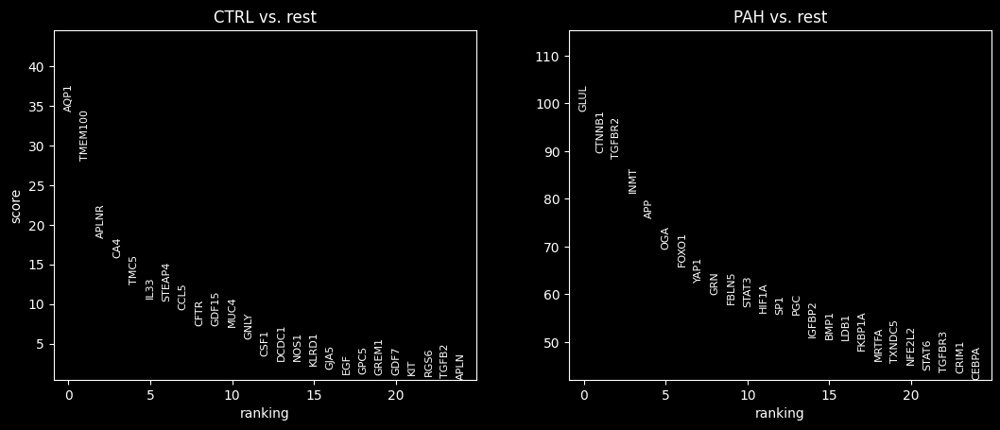

In [47]:
sc.tl.rank_genes_groups(concat, 'group', method='wilcoxon', key_added = "wilcoxon")
sc.pl.rank_genes_groups(concat, n_genes=25, sharey=False, key="wilcoxon")

In [83]:
glist = sc.get.rank_genes_groups_df(concat, group='PAH', 
                                    key='wilcoxon', log2fc_min=0.25, 
                                    pval_cutoff=0.05)['names'].squeeze().str.strip().tolist()

<Axes: title={'center': 'Reactome_2022'}, xlabel='$- \\log_{10}$ (Adjusted P-value)'>

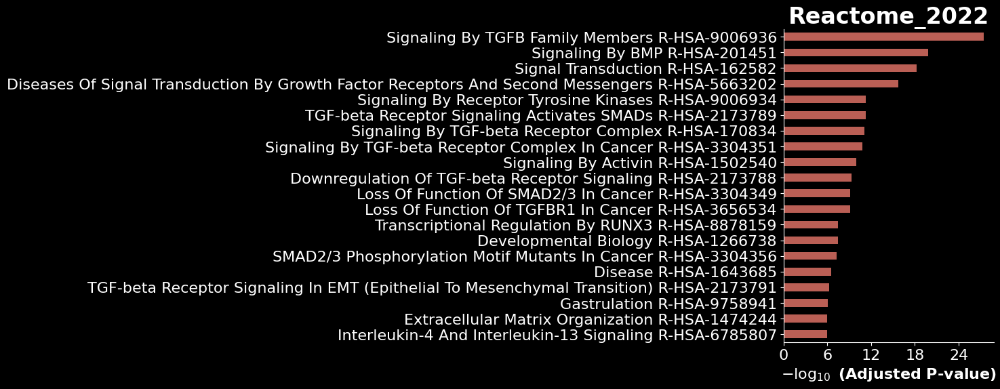

In [62]:
enr_res = gseapy.enrichr(gene_list=glist,
                     organism='Human',
                     gene_sets='Reactome_2022',
                     cutoff = 0.5)
gseapy.barplot(enr_res.res2d,title='Reactome_2022',size=10, top_term=20)

<Axes: title={'center': 'KEGG_2021_Human'}, xlabel='$- \\log_{10}$ (Adjusted P-value)'>

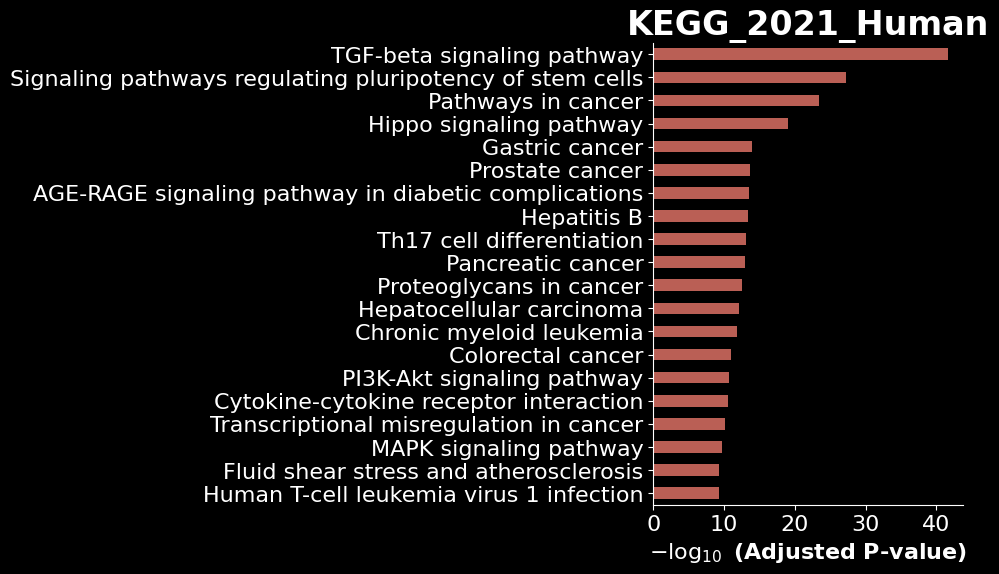

In [70]:
enr_res = gseapy.enrichr(gene_list=glist,
                     organism='Human',
                     gene_sets='KEGG_2021_Human',
                     cutoff = 0.5)
gseapy.barplot(enr_res.res2d,title='KEGG_2021_Human',size=10, top_term=20)

<Axes: title={'center': 'GO_Biological_Process_2023'}, xlabel='$- \\log_{10}$ (Adjusted P-value)'>

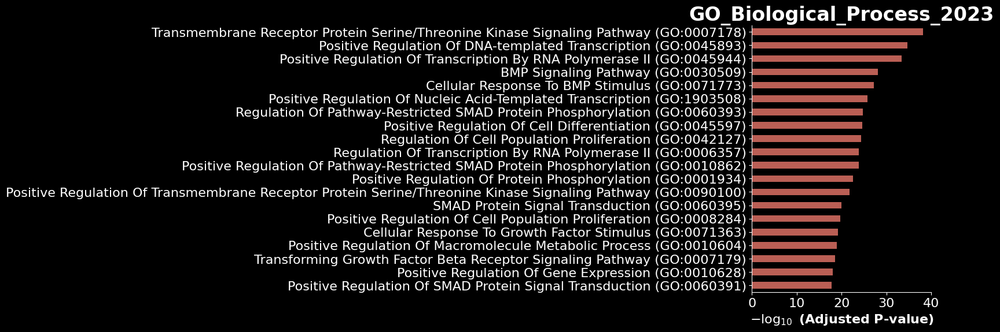

In [68]:
enr_res = gseapy.enrichr(gene_list=glist,
                     organism='Human',
                     gene_sets='GO_Biological_Process_2023',
                     cutoff = 0.5)
gseapy.barplot(enr_res.res2d,title='GO_Biological_Process_2023',size=10, top_term=20)

In [61]:
libs = gseapy.get_library_name(organism='Human')
libs

['ARCHS4_Cell-lines',
 'ARCHS4_IDG_Coexp',
 'ARCHS4_Kinases_Coexp',
 'ARCHS4_TFs_Coexp',
 'ARCHS4_Tissues',
 'Achilles_fitness_decrease',
 'Achilles_fitness_increase',
 'Aging_Perturbations_from_GEO_down',
 'Aging_Perturbations_from_GEO_up',
 'Allen_Brain_Atlas_10x_scRNA_2021',
 'Allen_Brain_Atlas_down',
 'Allen_Brain_Atlas_up',
 'Azimuth_Cell_Types_2021',
 'BioCarta_2013',
 'BioCarta_2015',
 'BioCarta_2016',
 'BioPlanet_2019',
 'BioPlex_2017',
 'CCLE_Proteomics_2020',
 'CORUM',
 'COVID-19_Related_Gene_Sets',
 'COVID-19_Related_Gene_Sets_2021',
 'Cancer_Cell_Line_Encyclopedia',
 'CellMarker_Augmented_2021',
 'ChEA_2013',
 'ChEA_2015',
 'ChEA_2016',
 'ChEA_2022',
 'Chromosome_Location',
 'Chromosome_Location_hg19',
 'ClinVar_2019',
 'DSigDB',
 'Data_Acquisition_Method_Most_Popular_Genes',
 'DepMap_WG_CRISPR_Screens_Broad_CellLines_2019',
 'DepMap_WG_CRISPR_Screens_Sanger_CellLines_2019',
 'Descartes_Cell_Types_and_Tissue_2021',
 'Diabetes_Perturbations_GEO_2022',
 'DisGeNET',
 'Disease_